In [1]:
import pandas as pd
import numpy as np
import csv
from scipy.stats import pearsonr
from scipy.stats import ConstantInputWarning
from statsmodels.tsa.stattools import acf
import matplotlib.pyplot as plt
import seaborn as sns

import warnings

### Get and prep the data

In [2]:
area = 'pfdl' # pfp

In [3]:
#results_folder = 'Q:\\Personal\\Irina\\projects\\isttc\\results\\monkey\\'
results_folder = 'E:\\projects_q_30_10_2024\\isttc\\results\\monkey\\'
save_folder = results_folder + 'fixation_period_1000ms\\' + area + '\\acf\\'
#results_folder = 'D:\\projects_q_30_10_2024\\isttc\\results\\monkey\\'

csv_data_file_pfdl = results_folder + 'data_' + area + '_fixon_1500ms_fixation_binned_50ms.csv'
with open(csv_data_file_pfdl, newline='') as f:
    reader = csv.reader(f)
    sua_list_pfdl = list(reader)
    
n_spike_trains_pfdl = len(sua_list_pfdl)
print('N spike_trains in {} fixON {}'.format(area, n_spike_trains_pfdl))

# transform list to an array and to a dataframe 
sua_array_pfdl = np.array(sua_list_pfdl)
print(sua_array_pfdl.shape)

# for 1000 calc
sua_array_pfdl = sua_array_pfdl[:, :-1-9]
print(sua_array_pfdl.shape)

bin_cols = ['bin_' + str(i) for i in range(sua_array_pfdl.shape[1]-3)]
sua_pfdl_df = pd.DataFrame(sua_array_pfdl, columns=['unit_id', 'trial_id','condition_id'] + bin_cols)
sua_pfdl_df = sua_pfdl_df.astype('int')
print(len(sua_pfdl_df))

n_units = len(sua_pfdl_df['unit_id'].unique())
print('n units {}'.format(n_units))

# average unit activity across trails and conditions
unit_average_df = sua_pfdl_df.groupby(by='unit_id', as_index=False)[bin_cols].mean()
print(len(unit_average_df))

N spike_trains in pfdl fixON 33018
(33018, 33)
(33018, 23)
33018
n units 543
543


In [ ]:
sua_pfdl_df

#### Apply contstraints to dataset

1. at least 20 completed trials
2. at least 1hz of mean activity during the fixation period
3. each 50-ms time bin during fixation with nonzero mean activity

In [4]:
# at least 20 completed trials
unit_trial_count_df = sua_pfdl_df.groupby(by='unit_id', as_index=False)['trial_id'].count()
unit_trial_count_df.rename(columns={'trial_id':'n_trials'}, inplace=True)
unit_trial_count_more20_df = unit_trial_count_df.query('n_trials >= 20').copy()
n_units_trials_20 = len(unit_trial_count_more20_df)
units_trials_20 = unit_trial_count_more20_df['unit_id'].values
#unit_trial_count_more20_df

sua_pfdl_trials_20_df = sua_pfdl_df[sua_pfdl_df['unit_id'].isin(units_trials_20)].copy()
print(len(sua_pfdl_trials_20_df['unit_id'].unique()))

499


In [5]:
# each 50-ms time bin during fixation with nonzero mean activity
trial_mean_activity_df = sua_pfdl_trials_20_df.groupby(by='unit_id', as_index=False)[bin_cols].mean()

# n rows with nans
n_nans_trial_mean_activity_df = trial_mean_activity_df.isna().any(axis=1).sum()
print('n rows with nans {}'.format(n_nans_trial_mean_activity_df))

# n rows with 0
rows_without_0_unit_id_l = trial_mean_activity_df[(trial_mean_activity_df[bin_cols].values != 0).all(axis=1)]['unit_id'].values.tolist()
n_units_without_0_bins = len(rows_without_0_unit_id_l)
print('n rows without 0 bins {}'.format(n_units_without_0_bins))

sua_pfdl_trials_20_no_0_bins_df = sua_pfdl_trials_20_df[sua_pfdl_trials_20_df['unit_id'].isin(rows_without_0_unit_id_l)].copy()
print(len(sua_pfdl_trials_20_no_0_bins_df['unit_id'].unique()))

n rows with nans 0
n rows without 0 bins 382
382


In [6]:
# at least 1hz of mean activity during the fixation period
trials_20_no_0_bins_mean_activity_df = sua_pfdl_trials_20_no_0_bins_df.groupby(by='unit_id', as_index=False)[bin_cols].mean()
trials_20_no_0_bins_mean_activity_df['bins_sum'] = trials_20_no_0_bins_mean_activity_df[bin_cols].sum(axis=1)
trials_20_no_0_bins_mean_activity_df['fr_hz'] = trials_20_no_0_bins_mean_activity_df['bins_sum']/1.5 # 1500ms
units_more_1hz_l = trials_20_no_0_bins_mean_activity_df.query('fr_hz >= 1')['unit_id'].values
n_units_more_1hz_l = len(units_more_1hz_l)

sua_pfdl_trials_20_no_0_bins_1hz_df = sua_pfdl_trials_20_no_0_bins_df[sua_pfdl_trials_20_no_0_bins_df['unit_id'].isin(units_more_1hz_l)].copy()
print(len(sua_pfdl_trials_20_no_0_bins_1hz_df['unit_id'].unique()))

367


In [7]:
print('After first constraint: {}'.format(n_units_trials_20))
print('After second constraint: {}'.format(n_units_without_0_bins))
print('After third constraint: {}'.format(n_units_more_1hz_l))

After first constraint: 499
After second constraint: 382
After third constraint: 367


### Calculate autocorrelation

In [8]:
def autocorr_pearsonr(signal_, lag_=1, verbose=True):
    # autocorrelation for 1 lag, using pearsonr from scipy
    if verbose:
        print('Calc for lag {}, input length {}'.format(lag_, signal_.shape))
    with warnings.catch_warnings():
        warnings.filterwarnings('error')
        try:
            r, p = pearsonr(signal_[lag_:], signal_[:-lag_])
        except ConstantInputWarning as e:
            print('ERROR: Pearson r can not be calculated for lag {}'.format(lag_))
            r = np.nan
    if verbose:
        print('ac_lag {}'.format(r))
    return r  

def acf_pearsonr(signal_, nlags=2, verbose=True):
    acf = [1] 
    for i in range(1, nlags): # todo why I had here nlags+1?
        acf.append(autocorr_pearsonr(signal_, i, verbose)) 
    return np.array(acf)

def acf_pearsonr_trial_avg(trials_time_series_2d, nlags_, verbose=True):
    time_series_a = trials_time_series_2d[:, :nlags_]
    nbins = time_series_a.shape[1]
    if verbose:
        print('nbins to use {}'.format(nbins))
    acf_matrix = np.zeros((nbins, nbins))

    for i in np.arange(nbins-1):
        for j in np.arange(i+1, nbins): # filling i-th row
            with warnings.catch_warnings():
                warnings.filterwarnings('error')
                try:
                    r, p = pearsonr(time_series_a[:,i], time_series_a[:,j]) 
                    acf_matrix[i, j] = r
                except ConstantInputWarning as e:
                    print('ERROR: Pearson r can not be calculated for i={}, j={}'.format(i,j))
                    acf_matrix[i, j] = np.nan
            
    np.fill_diagonal(acf_matrix, 1)
            
    acf_average = np.zeros((nbins,))
    for i in range(nbins):
        with warnings.catch_warnings():
            warnings.filterwarnings('error')
            try:
                acf_average[i] = np.nanmean(np.diag(acf_matrix, k=i))
            except RuntimeWarning as e:
                print('ERROR: Mean can not be calculated for lag={}'.format(i), e)
                acf_average[i] = np.nan
                
    return acf_matrix, acf_average

In [9]:
n_lags = 20
acf_cols = ['acf_' + str(i) for i in range(n_lags)]
print('acf_cols {}'.format(acf_cols))

acf_cols ['acf_0', 'acf_1', 'acf_2', 'acf_3', 'acf_4', 'acf_5', 'acf_6', 'acf_7', 'acf_8', 'acf_9', 'acf_10', 'acf_11', 'acf_12', 'acf_13', 'acf_14', 'acf_15', 'acf_16', 'acf_17', 'acf_18', 'acf_19']


In [10]:
unit_average_df = sua_pfdl_trials_20_no_0_bins_1hz_df.groupby(by='unit_id', as_index=False)[bin_cols].mean()
sua_pfdl_df = sua_pfdl_trials_20_no_0_bins_1hz_df

In [ ]:
unit_average_df

#### Calc acf (acf/Pearson) for average over trials and conditions (1 ACF per unit)

In [11]:
acf_proper_trial_mean_l = []

for unit in range(len(unit_average_df)):
    print('Processing unit {}'.format(unit_average_df['unit_id'].values[unit]))
    # there is nothing to correlated with at lag 20 for 1000ms
    # acf will return 0 because of the formula
    acf_proper_trial_mean = acf(unit_average_df[bin_cols].values[unit, :], nlags=n_lags) 
    acf_proper_trial_mean_l.append(acf_proper_trial_mean)

acf_proper_trial_mean_df = pd.DataFrame(np.array(acf_proper_trial_mean_l), columns=acf_cols)
acf_proper_trial_mean_df.insert(0, 'unit_id', unit_average_df['unit_id'].values)

print('NaNs in acf {}'.format(acf_proper_trial_mean_df.isnull().any().any()))
acf_proper_trial_mean_df.head(3)

Processing unit 0
Processing unit 3
Processing unit 4
Processing unit 5
Processing unit 6
Processing unit 7
Processing unit 8
Processing unit 9
Processing unit 10
Processing unit 11
Processing unit 12
Processing unit 14
Processing unit 15
Processing unit 16
Processing unit 17
Processing unit 18
Processing unit 20
Processing unit 21
Processing unit 22
Processing unit 26
Processing unit 27
Processing unit 29
Processing unit 30
Processing unit 31
Processing unit 32
Processing unit 33
Processing unit 34
Processing unit 36
Processing unit 37
Processing unit 38
Processing unit 39
Processing unit 40
Processing unit 41
Processing unit 42
Processing unit 43
Processing unit 45
Processing unit 49
Processing unit 51
Processing unit 52
Processing unit 56
Processing unit 57
Processing unit 58
Processing unit 59
Processing unit 60
Processing unit 64
Processing unit 65
Processing unit 66
Processing unit 67
Processing unit 68
Processing unit 69
Processing unit 70
Processing unit 71
Processing unit 72
P

,unit_id,acf_0,acf_1,acf_2,acf_3,acf_4,acf_5,acf_6,acf_7,acf_8,...,acf_10,acf_11,acf_12,acf_13,acf_14,acf_15,acf_16,acf_17,acf_18,acf_19
0,0,1.0,-0.028641,-0.170128,-0.114518,0.046458,0.217994,0.050330,-0.139771,-0.202728,...,-0.024637,0.239727,-0.069820,-0.041487,-0.087505,-0.126485,0.152838,0.059745,-0.155213,-0.059129
1,3,1.0,-0.031455,-0.365647,-0.102684,0.370424,0.035427,-0.432689,0.043908,0.083575,...,-0.325282,-0.019914,0.154214,0.090553,-0.142727,-0.178744,0.143800,0.017069,0.035802,-0.011218
2,4,1.0,-0.213541,-0.046581,0.032024,0.215234,-0.528097,0.301016,0.031280,-0.023155,...,0.139472,-0.248409,0.017739,-0.055315,-0.033920,-0.051117,0.028165,0.001490,0.046242,0.054096


In [12]:
acf_pearsonr_trial_mean_l = []

for unit in range(len(unit_average_df)):
    print('Processing unit {}'.format(unit_average_df['unit_id'].values[unit]))
    acf_pearsonr_trial_mean = acf_pearsonr(unit_average_df[bin_cols].values[unit, :], nlags=n_lags-1, verbose=False) # -2 for calc 1000 todo
    acf_pearsonr_trial_mean_l.append(acf_pearsonr_trial_mean)

acf_pearsonr_trial_mean_df = pd.DataFrame(np.array(acf_pearsonr_trial_mean_l), columns=acf_cols[:-1]) # also for 1000
acf_pearsonr_trial_mean_df.insert(0, 'unit_id', unit_average_df['unit_id'].values)

print('NaNs in acf {}'.format(acf_pearsonr_trial_mean_df.isnull().any().any()))
acf_pearsonr_trial_mean_df.head(3)

Processing unit 0
Calc for lag 1, input length (20,)
ac_lag -0.03129910878375859
Calc for lag 2, input length (20,)
ac_lag -0.20988853050305736
Calc for lag 3, input length (20,)
ac_lag -0.16536094686823208
Calc for lag 4, input length (20,)
ac_lag 0.0692818227550259
Calc for lag 5, input length (20,)
ac_lag 0.35693912522959803
Calc for lag 6, input length (20,)
ac_lag 0.10745247371682229
Calc for lag 7, input length (20,)
ac_lag -0.19612887108930632
Calc for lag 8, input length (20,)
ac_lag -0.30347664641938465
Calc for lag 9, input length (20,)
ac_lag -0.056317253204683254
Calc for lag 10, input length (20,)
ac_lag 0.0461682865848312
Calc for lag 11, input length (20,)
ac_lag 0.6906005837114931
Calc for lag 12, input length (20,)
ac_lag -0.1256932243726172
Calc for lag 13, input length (20,)
ac_lag -0.012034825013215131
Calc for lag 14, input length (20,)
ac_lag -0.239131774178779
Calc for lag 15, input length (20,)
ac_lag -0.4952231318294952
Calc for lag 16, input length (20,)
ac_la

,unit_id,acf_0,acf_1,acf_2,acf_3,acf_4,acf_5,acf_6,acf_7,acf_8,acf_9,acf_10,acf_11,acf_12,acf_13,acf_14,acf_15,acf_16,acf_17,acf_18
0,0,1.0,-0.031299,-0.209889,-0.165361,0.069282,0.356939,0.107452,-0.196129,-0.303477,-0.056317,0.046168,0.690601,-0.125693,-0.012035,-0.239132,-0.495223,0.859015,0.500000,-1.0
1,3,1.0,-0.031291,-0.411103,-0.140912,0.497470,0.052055,-0.622222,0.058154,0.142634,0.288163,-0.731105,-0.046156,0.414963,0.263368,-0.516675,-0.689954,0.649030,-0.397360,-1.0
2,4,1.0,-0.238205,-0.058338,0.031289,0.252487,-0.652370,0.562140,0.083509,-0.030584,-0.324308,0.389862,-0.665166,0.109554,-0.111028,-0.006222,-0.530986,0.467099,-0.996616,-1.0


In [ ]:
acf_proper_trial_mean_df.to_pickle(save_folder + 'acf_proper_trial_mean_constraint_input_50ms_20lags_df.pkl')
acf_pearsonr_trial_mean_df.to_pickle(save_folder + 'acf_pearsonr_trial_mean_constraint_input_50ms_20lags_df.pkl')

#### Calc acf (acf/Pearson) per trial (multiple ACFs per unit)

In [13]:
acf_proper_l = []

for idx in range(len(sua_pfdl_df)):
    print('Processing unit {}, trial {}'.format(sua_pfdl_df['unit_id'].values[idx], sua_pfdl_df['trial_id'].values[idx]))
    acf_proper = acf(sua_pfdl_df[bin_cols].values[idx, :], nlags=n_lags)
    acf_proper_l.append(acf_proper)

acf_proper_df = pd.DataFrame(np.array(acf_proper_l), columns=acf_cols)
acf_proper_df.insert(0, 'unit_id', sua_pfdl_df['unit_id'].values)
acf_proper_df.insert(1, 'trial_id', sua_pfdl_df['trial_id'].values)

print('NaNs in acf {}'.format(acf_proper_df.isnull().any().any()))
acf_proper_df.head(3)

Processing unit 0, trial 0
Processing unit 0, trial 1
Processing unit 0, trial 2
Processing unit 0, trial 3
Processing unit 0, trial 4
Processing unit 0, trial 5
Processing unit 0, trial 6
Processing unit 0, trial 7
Processing unit 0, trial 8
Processing unit 0, trial 9
Processing unit 0, trial 10
Processing unit 0, trial 11
Processing unit 0, trial 12
Processing unit 0, trial 13
Processing unit 0, trial 14
Processing unit 0, trial 15
Processing unit 0, trial 16
Processing unit 0, trial 17
Processing unit 0, trial 18
Processing unit 0, trial 19
Processing unit 0, trial 20
Processing unit 0, trial 21
Processing unit 0, trial 22
Processing unit 0, trial 23
Processing unit 0, trial 24
Processing unit 0, trial 25
Processing unit 0, trial 26
Processing unit 0, trial 27
Processing unit 0, trial 28
Processing unit 0, trial 29
Processing unit 0, trial 30
Processing unit 0, trial 31
Processing unit 0, trial 32
Processing unit 0, trial 33
Processing unit 0, trial 34
Processing unit 0, trial 35
Pr

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 4, trial 46
Processing unit 4, trial 47
Processing unit 4, trial 49
Processing unit 4, trial 50
Processing unit 4, trial 51
Processing unit 4, trial 52
Processing unit 4, trial 53
Processing unit 4, trial 54
Processing unit 4, trial 55
Processing unit 4, trial 56
Processing unit 4, trial 57
Processing unit 4, trial 59
Processing unit 4, trial 60
Processing unit 4, trial 61
Processing unit 4, trial 62
Processing unit 4, trial 63
Processing unit 4, trial 64
Processing unit 4, trial 65
Processing unit 4, trial 66
Processing unit 4, trial 67
Processing unit 4, trial 68
Processing unit 4, trial 69
Processing unit 4, trial 70
Processing unit 4, trial 71
Processing unit 4, trial 72
Processing unit 4, trial 73
Processing unit 4, trial 74
Processing unit 4, trial 75
Processing unit 4, trial 76
Processing unit 4, trial 77
Processing unit 4, trial 78
Processing unit 4, trial 81
Processing unit 4, trial 82
Processing unit 4, trial 84
Processing unit 4, trial 85
Processing unit 4, t

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 8, trial 80
Processing unit 8, trial 81
Processing unit 8, trial 82
Processing unit 8, trial 83
Processing unit 9, trial 0
Processing unit 9, trial 1
Processing unit 9, trial 2
Processing unit 9, trial 3
Processing unit 9, trial 4
Processing unit 9, trial 5
Processing unit 9, trial 6
Processing unit 9, trial 7
Processing unit 9, trial 9
Processing unit 9, trial 10
Processing unit 9, trial 11
Processing unit 9, trial 12
Processing unit 9, trial 13
Processing unit 9, trial 14
Processing unit 9, trial 15
Processing unit 9, trial 16
Processing unit 9, trial 17
Processing unit 9, trial 18
Processing unit 9, trial 19
Processing unit 9, trial 20
Processing unit 9, trial 21
Processing unit 9, trial 23
Processing unit 9, trial 24
Processing unit 9, trial 25
Processing unit 9, trial 26
Processing unit 9, trial 27
Processing unit 9, trial 28
Processing unit 9, trial 29
Processing unit 9, trial 30
Processing unit 9, trial 31
Processing unit 9, trial 32
Processing unit 9, trial 33
P

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 16, trial 80
Processing unit 16, trial 84
Processing unit 16, trial 85
Processing unit 16, trial 86
Processing unit 16, trial 87
Processing unit 16, trial 89
Processing unit 16, trial 90
Processing unit 16, trial 91
Processing unit 16, trial 93
Processing unit 16, trial 94
Processing unit 16, trial 95
Processing unit 16, trial 96
Processing unit 16, trial 97
Processing unit 16, trial 98
Processing unit 16, trial 99
Processing unit 16, trial 100
Processing unit 16, trial 101
Processing unit 16, trial 102
Processing unit 16, trial 104
Processing unit 16, trial 105
Processing unit 16, trial 107
Processing unit 16, trial 108
Processing unit 16, trial 109
Processing unit 16, trial 110
Processing unit 16, trial 112
Processing unit 17, trial 0
Processing unit 17, trial 1
Processing unit 17, trial 2
Processing unit 17, trial 3
Processing unit 17, trial 4
Processing unit 17, trial 5
Processing unit 17, trial 6
Processing unit 17, trial 7
Processing unit 17, trial 8
Processing un

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 20, trial 21
Processing unit 20, trial 22
Processing unit 20, trial 24
Processing unit 20, trial 25
Processing unit 20, trial 26
Processing unit 20, trial 29
Processing unit 20, trial 31
Processing unit 20, trial 32
Processing unit 20, trial 33
Processing unit 20, trial 35
Processing unit 20, trial 38
Processing unit 20, trial 42
Processing unit 20, trial 43
Processing unit 20, trial 45
Processing unit 20, trial 48
Processing unit 20, trial 49
Processing unit 20, trial 51
Processing unit 20, trial 52
Processing unit 20, trial 53
Processing unit 20, trial 55
Processing unit 20, trial 58
Processing unit 20, trial 61
Processing unit 20, trial 62
Processing unit 20, trial 63
Processing unit 20, trial 66
Processing unit 20, trial 70
Processing unit 20, trial 71
Processing unit 20, trial 73
Processing unit 20, trial 75
Processing unit 20, trial 76
Processing unit 20, trial 77
Processing unit 20, trial 79
Processing unit 20, trial 84
Processing unit 20, trial 87
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 26, trial 27
Processing unit 26, trial 28
Processing unit 26, trial 29
Processing unit 26, trial 30
Processing unit 26, trial 31
Processing unit 26, trial 32
Processing unit 26, trial 33
Processing unit 26, trial 34
Processing unit 26, trial 35
Processing unit 26, trial 36
Processing unit 26, trial 37
Processing unit 26, trial 38
Processing unit 26, trial 39
Processing unit 26, trial 40
Processing unit 26, trial 41
Processing unit 26, trial 42
Processing unit 26, trial 43
Processing unit 26, trial 44
Processing unit 26, trial 45
Processing unit 26, trial 46
Processing unit 26, trial 47
Processing unit 26, trial 48
Processing unit 26, trial 49
Processing unit 27, trial 0
Processing unit 27, trial 1
Processing unit 27, trial 2
Processing unit 27, trial 3
Processing unit 27, trial 4
Processing unit 27, trial 5
Processing unit 27, trial 6
Processing unit 27, trial 7
Processing unit 27, trial 9
Processing unit 27, trial 10
Processing unit 27, trial 12
Processing unit 27, tri

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 32, trial 38
Processing unit 32, trial 39
Processing unit 32, trial 40
Processing unit 32, trial 41
Processing unit 32, trial 42
Processing unit 32, trial 43
Processing unit 32, trial 44
Processing unit 32, trial 45
Processing unit 32, trial 46
Processing unit 32, trial 47
Processing unit 32, trial 48
Processing unit 32, trial 49
Processing unit 32, trial 50
Processing unit 32, trial 51
Processing unit 32, trial 52
Processing unit 32, trial 53
Processing unit 32, trial 54
Processing unit 32, trial 55
Processing unit 32, trial 56
Processing unit 32, trial 57
Processing unit 32, trial 58
Processing unit 32, trial 59
Processing unit 32, trial 60
Processing unit 33, trial 0
Processing unit 33, trial 1
Processing unit 33, trial 2
Processing unit 33, trial 3
Processing unit 33, trial 4
Processing unit 33, trial 5
Processing unit 33, trial 6
Processing unit 33, trial 7
Processing unit 33, trial 8
Processing unit 33, trial 9
Processing unit 33, trial 10
Processing unit 33, tria

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 36, trial 54
Processing unit 36, trial 55
Processing unit 36, trial 56
Processing unit 36, trial 57
Processing unit 36, trial 58
Processing unit 36, trial 59
Processing unit 36, trial 60
Processing unit 36, trial 61
Processing unit 36, trial 62
Processing unit 36, trial 63
Processing unit 36, trial 64
Processing unit 36, trial 65
Processing unit 36, trial 66
Processing unit 36, trial 67
Processing unit 36, trial 68
Processing unit 36, trial 69
Processing unit 36, trial 70
Processing unit 36, trial 71
Processing unit 36, trial 72
Processing unit 36, trial 73
Processing unit 36, trial 74
Processing unit 36, trial 75
Processing unit 36, trial 76
Processing unit 36, trial 77
Processing unit 36, trial 78
Processing unit 36, trial 79
Processing unit 36, trial 80
Processing unit 36, trial 81
Processing unit 36, trial 82
Processing unit 36, trial 83
Processing unit 36, trial 84
Processing unit 36, trial 85
Processing unit 36, trial 86
Processing unit 36, trial 87
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 38, trial 57
Processing unit 38, trial 58
Processing unit 38, trial 59
Processing unit 38, trial 60
Processing unit 38, trial 61
Processing unit 38, trial 62
Processing unit 38, trial 63
Processing unit 38, trial 64
Processing unit 38, trial 65
Processing unit 38, trial 66
Processing unit 38, trial 67
Processing unit 38, trial 68
Processing unit 38, trial 69
Processing unit 38, trial 70
Processing unit 38, trial 71
Processing unit 38, trial 72
Processing unit 38, trial 73
Processing unit 38, trial 74
Processing unit 38, trial 75
Processing unit 38, trial 76
Processing unit 38, trial 77
Processing unit 38, trial 78
Processing unit 38, trial 79
Processing unit 38, trial 80
Processing unit 38, trial 81
Processing unit 38, trial 82
Processing unit 38, trial 83
Processing unit 38, trial 84
Processing unit 38, trial 85
Processing unit 38, trial 86
Processing unit 38, trial 87
Processing unit 38, trial 89
Processing unit 38, trial 90
Processing unit 38, trial 91
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 42, trial 34
Processing unit 42, trial 35
Processing unit 42, trial 36
Processing unit 42, trial 37
Processing unit 42, trial 38
Processing unit 42, trial 39
Processing unit 42, trial 40
Processing unit 42, trial 41
Processing unit 42, trial 42
Processing unit 42, trial 43
Processing unit 42, trial 44
Processing unit 42, trial 45
Processing unit 42, trial 46
Processing unit 42, trial 47
Processing unit 42, trial 48
Processing unit 42, trial 49
Processing unit 42, trial 50
Processing unit 42, trial 51
Processing unit 42, trial 52
Processing unit 42, trial 53
Processing unit 42, trial 54
Processing unit 42, trial 55
Processing unit 42, trial 56
Processing unit 42, trial 57
Processing unit 42, trial 58
Processing unit 42, trial 59
Processing unit 42, trial 60
Processing unit 42, trial 61
Processing unit 42, trial 62
Processing unit 42, trial 63
Processing unit 42, trial 64
Processing unit 42, trial 65
Processing unit 42, trial 66
Processing unit 42, trial 67
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 45, trial 53
Processing unit 45, trial 54
Processing unit 45, trial 55
Processing unit 45, trial 56
Processing unit 45, trial 57
Processing unit 45, trial 58
Processing unit 45, trial 59
Processing unit 45, trial 60
Processing unit 45, trial 61
Processing unit 45, trial 63
Processing unit 45, trial 65
Processing unit 45, trial 66
Processing unit 45, trial 68
Processing unit 45, trial 70
Processing unit 45, trial 71
Processing unit 45, trial 72
Processing unit 45, trial 73
Processing unit 45, trial 75
Processing unit 45, trial 76
Processing unit 45, trial 77
Processing unit 45, trial 78
Processing unit 45, trial 80
Processing unit 45, trial 82
Processing unit 45, trial 84
Processing unit 45, trial 85
Processing unit 45, trial 87
Processing unit 45, trial 89
Processing unit 45, trial 90
Processing unit 45, trial 91
Processing unit 45, trial 93
Processing unit 45, trial 94
Processing unit 45, trial 95
Processing unit 45, trial 96
Processing unit 45, trial 97
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 52, trial 82
Processing unit 52, trial 83
Processing unit 52, trial 84
Processing unit 52, trial 86
Processing unit 52, trial 87
Processing unit 52, trial 90
Processing unit 52, trial 91
Processing unit 52, trial 92
Processing unit 52, trial 93
Processing unit 52, trial 94
Processing unit 52, trial 95
Processing unit 52, trial 98
Processing unit 52, trial 99
Processing unit 52, trial 100
Processing unit 52, trial 101
Processing unit 52, trial 102
Processing unit 52, trial 103
Processing unit 52, trial 104
Processing unit 52, trial 105
Processing unit 52, trial 106
Processing unit 56, trial 0
Processing unit 56, trial 1
Processing unit 56, trial 2
Processing unit 56, trial 3
Processing unit 56, trial 4
Processing unit 56, trial 5
Processing unit 56, trial 6
Processing unit 56, trial 7
Processing unit 56, trial 8
Processing unit 56, trial 9
Processing unit 56, trial 10
Processing unit 56, trial 11
Processing unit 56, trial 12
Processing unit 56, trial 13
Processing unit 5

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 58, trial 46
Processing unit 58, trial 47
Processing unit 58, trial 48
Processing unit 59, trial 7
Processing unit 59, trial 8
Processing unit 59, trial 14
Processing unit 59, trial 18
Processing unit 59, trial 22
Processing unit 59, trial 23
Processing unit 59, trial 25
Processing unit 59, trial 26
Processing unit 59, trial 27
Processing unit 59, trial 29
Processing unit 59, trial 30
Processing unit 59, trial 32
Processing unit 59, trial 37
Processing unit 59, trial 43
Processing unit 59, trial 44
Processing unit 59, trial 45
Processing unit 59, trial 46
Processing unit 59, trial 50
Processing unit 59, trial 55
Processing unit 59, trial 56
Processing unit 59, trial 61
Processing unit 59, trial 66
Processing unit 59, trial 73
Processing unit 59, trial 74
Processing unit 59, trial 77
Processing unit 59, trial 86
Processing unit 59, trial 88
Processing unit 59, trial 89
Processing unit 59, trial 91
Processing unit 59, trial 93
Processing unit 60, trial 0
Processing unit 6

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 69, trial 15
Processing unit 69, trial 17
Processing unit 69, trial 19
Processing unit 69, trial 20
Processing unit 69, trial 21
Processing unit 69, trial 23
Processing unit 69, trial 25
Processing unit 69, trial 27
Processing unit 69, trial 28
Processing unit 69, trial 29
Processing unit 69, trial 30
Processing unit 69, trial 31
Processing unit 69, trial 32
Processing unit 69, trial 35
Processing unit 69, trial 36
Processing unit 69, trial 38
Processing unit 69, trial 39
Processing unit 69, trial 40
Processing unit 69, trial 41
Processing unit 69, trial 46
Processing unit 69, trial 50
Processing unit 69, trial 52
Processing unit 69, trial 53
Processing unit 69, trial 54
Processing unit 69, trial 56
Processing unit 69, trial 58
Processing unit 69, trial 59
Processing unit 69, trial 66
Processing unit 69, trial 67
Processing unit 69, trial 71
Processing unit 69, trial 75
Processing unit 69, trial 76
Processing unit 69, trial 77
Processing unit 69, trial 80
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 72, trial 12
Processing unit 72, trial 13
Processing unit 72, trial 14
Processing unit 72, trial 15
Processing unit 72, trial 16
Processing unit 72, trial 17
Processing unit 72, trial 18
Processing unit 72, trial 19
Processing unit 72, trial 20
Processing unit 72, trial 21
Processing unit 72, trial 23
Processing unit 72, trial 24
Processing unit 72, trial 25
Processing unit 72, trial 26
Processing unit 72, trial 27
Processing unit 72, trial 28
Processing unit 72, trial 29
Processing unit 72, trial 30
Processing unit 72, trial 31
Processing unit 72, trial 32
Processing unit 72, trial 33
Processing unit 72, trial 34
Processing unit 72, trial 35
Processing unit 72, trial 36
Processing unit 72, trial 37
Processing unit 72, trial 38
Processing unit 72, trial 39
Processing unit 72, trial 40
Processing unit 72, trial 41
Processing unit 72, trial 42
Processing unit 72, trial 43
Processing unit 72, trial 44
Processing unit 72, trial 45
Processing unit 72, trial 46
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 75, trial 98
Processing unit 75, trial 99
Processing unit 75, trial 100
Processing unit 75, trial 101
Processing unit 75, trial 102
Processing unit 75, trial 103
Processing unit 75, trial 104
Processing unit 75, trial 105
Processing unit 75, trial 106
Processing unit 75, trial 107
Processing unit 75, trial 108
Processing unit 75, trial 109
Processing unit 75, trial 110
Processing unit 75, trial 111
Processing unit 75, trial 112
Processing unit 75, trial 113
Processing unit 75, trial 114
Processing unit 75, trial 115
Processing unit 75, trial 116
Processing unit 75, trial 117
Processing unit 75, trial 118
Processing unit 75, trial 119
Processing unit 75, trial 120
Processing unit 75, trial 121
Processing unit 75, trial 122
Processing unit 76, trial 0
Processing unit 76, trial 1
Processing unit 76, trial 2
Processing unit 76, trial 3
Processing unit 76, trial 4
Processing unit 76, trial 5
Processing unit 76, trial 6
Processing unit 76, trial 7
Processing unit 76, trial 8


C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 77, trial 40
Processing unit 77, trial 41
Processing unit 77, trial 42
Processing unit 77, trial 43
Processing unit 77, trial 44
Processing unit 77, trial 45
Processing unit 77, trial 46
Processing unit 77, trial 47
Processing unit 77, trial 48
Processing unit 77, trial 49
Processing unit 77, trial 50
Processing unit 77, trial 51
Processing unit 77, trial 52
Processing unit 77, trial 53
Processing unit 77, trial 54
Processing unit 77, trial 55
Processing unit 77, trial 56
Processing unit 77, trial 57
Processing unit 77, trial 59
Processing unit 77, trial 61
Processing unit 77, trial 62
Processing unit 77, trial 63
Processing unit 77, trial 64
Processing unit 77, trial 65
Processing unit 77, trial 66
Processing unit 77, trial 67
Processing unit 77, trial 68
Processing unit 77, trial 69
Processing unit 77, trial 70
Processing unit 77, trial 71
Processing unit 77, trial 72
Processing unit 77, trial 73
Processing unit 77, trial 74
Processing unit 77, trial 75
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 80, trial 24
Processing unit 80, trial 27
Processing unit 80, trial 28
Processing unit 80, trial 29
Processing unit 80, trial 31
Processing unit 80, trial 32
Processing unit 80, trial 35
Processing unit 80, trial 36
Processing unit 80, trial 37
Processing unit 80, trial 38
Processing unit 80, trial 41
Processing unit 80, trial 42
Processing unit 80, trial 43
Processing unit 80, trial 44
Processing unit 80, trial 45
Processing unit 80, trial 48
Processing unit 80, trial 49
Processing unit 80, trial 50
Processing unit 80, trial 52
Processing unit 80, trial 54
Processing unit 80, trial 56
Processing unit 80, trial 58
Processing unit 80, trial 59
Processing unit 80, trial 60
Processing unit 80, trial 62
Processing unit 80, trial 65
Processing unit 80, trial 66
Processing unit 80, trial 67
Processing unit 80, trial 68
Processing unit 80, trial 69
Processing unit 80, trial 71
Processing unit 80, trial 72
Processing unit 80, trial 73
Processing unit 80, trial 75
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 87, trial 79
Processing unit 87, trial 82
Processing unit 87, trial 83
Processing unit 87, trial 84
Processing unit 87, trial 85
Processing unit 87, trial 86
Processing unit 87, trial 87
Processing unit 87, trial 88
Processing unit 87, trial 94
Processing unit 87, trial 96
Processing unit 87, trial 98
Processing unit 87, trial 99
Processing unit 87, trial 100
Processing unit 87, trial 101
Processing unit 88, trial 0
Processing unit 88, trial 1
Processing unit 88, trial 2
Processing unit 88, trial 3
Processing unit 88, trial 4
Processing unit 88, trial 5
Processing unit 88, trial 6
Processing unit 88, trial 7
Processing unit 88, trial 8
Processing unit 88, trial 9
Processing unit 88, trial 10
Processing unit 88, trial 11
Processing unit 88, trial 12
Processing unit 88, trial 13
Processing unit 88, trial 14
Processing unit 88, trial 15
Processing unit 88, trial 16
Processing unit 88, trial 17
Processing unit 88, trial 18
Processing unit 88, trial 19
Processing unit 88, tr

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 91, trial 25
Processing unit 91, trial 28
Processing unit 91, trial 29
Processing unit 91, trial 30
Processing unit 91, trial 31
Processing unit 91, trial 33
Processing unit 91, trial 34
Processing unit 91, trial 37
Processing unit 91, trial 38
Processing unit 91, trial 39
Processing unit 91, trial 41
Processing unit 91, trial 42
Processing unit 91, trial 43
Processing unit 91, trial 44
Processing unit 91, trial 45
Processing unit 91, trial 46
Processing unit 91, trial 47
Processing unit 91, trial 48
Processing unit 91, trial 50
Processing unit 91, trial 51
Processing unit 91, trial 52
Processing unit 91, trial 54
Processing unit 91, trial 55
Processing unit 91, trial 57
Processing unit 91, trial 58
Processing unit 91, trial 60
Processing unit 91, trial 61
Processing unit 91, trial 62
Processing unit 91, trial 64
Processing unit 91, trial 65
Processing unit 91, trial 66
Processing unit 91, trial 67
Processing unit 91, trial 68
Processing unit 91, trial 69
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 97, trial 46
Processing unit 97, trial 47
Processing unit 97, trial 49
Processing unit 97, trial 50
Processing unit 97, trial 51
Processing unit 97, trial 52
Processing unit 97, trial 53
Processing unit 97, trial 54
Processing unit 97, trial 55
Processing unit 97, trial 57
Processing unit 97, trial 58
Processing unit 97, trial 60
Processing unit 97, trial 61
Processing unit 97, trial 62
Processing unit 97, trial 63
Processing unit 97, trial 64
Processing unit 97, trial 66
Processing unit 97, trial 67
Processing unit 97, trial 68
Processing unit 97, trial 69
Processing unit 97, trial 71
Processing unit 97, trial 72
Processing unit 97, trial 73
Processing unit 97, trial 78
Processing unit 97, trial 79
Processing unit 97, trial 81
Processing unit 97, trial 83
Processing unit 97, trial 84
Processing unit 97, trial 85
Processing unit 97, trial 86
Processing unit 97, trial 87
Processing unit 97, trial 88
Processing unit 97, trial 89
Processing unit 97, trial 90
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 101, trial 32
Processing unit 101, trial 33
Processing unit 101, trial 34
Processing unit 101, trial 36
Processing unit 101, trial 38
Processing unit 101, trial 39
Processing unit 101, trial 40
Processing unit 101, trial 41
Processing unit 101, trial 42
Processing unit 101, trial 43
Processing unit 101, trial 44
Processing unit 101, trial 45
Processing unit 101, trial 46
Processing unit 101, trial 47
Processing unit 101, trial 48
Processing unit 101, trial 49
Processing unit 101, trial 50
Processing unit 101, trial 51
Processing unit 101, trial 52
Processing unit 101, trial 53
Processing unit 101, trial 54
Processing unit 101, trial 55
Processing unit 101, trial 56
Processing unit 101, trial 57
Processing unit 101, trial 58
Processing unit 101, trial 59
Processing unit 101, trial 60
Processing unit 101, trial 61
Processing unit 101, trial 62
Processing unit 101, trial 63
Processing unit 101, trial 64
Processing unit 101, trial 66
Processing unit 101, trial 67
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 107, trial 16
Processing unit 107, trial 17
Processing unit 107, trial 18
Processing unit 107, trial 19
Processing unit 107, trial 20
Processing unit 107, trial 21
Processing unit 107, trial 22
Processing unit 107, trial 24
Processing unit 107, trial 25
Processing unit 107, trial 26
Processing unit 107, trial 27
Processing unit 107, trial 28
Processing unit 107, trial 29
Processing unit 107, trial 30
Processing unit 107, trial 31
Processing unit 107, trial 32
Processing unit 107, trial 33
Processing unit 107, trial 34
Processing unit 107, trial 35
Processing unit 107, trial 36
Processing unit 107, trial 37
Processing unit 107, trial 38
Processing unit 107, trial 39
Processing unit 107, trial 40
Processing unit 107, trial 41
Processing unit 107, trial 42
Processing unit 107, trial 43
Processing unit 107, trial 44
Processing unit 107, trial 45
Processing unit 107, trial 46
Processing unit 107, trial 47
Processing unit 107, trial 48
Processing unit 107, trial 49
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 109, trial 25
Processing unit 109, trial 26
Processing unit 109, trial 27
Processing unit 109, trial 28
Processing unit 109, trial 29
Processing unit 109, trial 31
Processing unit 109, trial 32
Processing unit 109, trial 33
Processing unit 109, trial 34
Processing unit 109, trial 35
Processing unit 109, trial 36
Processing unit 109, trial 37
Processing unit 109, trial 38
Processing unit 109, trial 39
Processing unit 109, trial 40
Processing unit 109, trial 41
Processing unit 109, trial 42
Processing unit 109, trial 43
Processing unit 109, trial 45
Processing unit 109, trial 46
Processing unit 109, trial 47
Processing unit 109, trial 48
Processing unit 109, trial 49
Processing unit 109, trial 51
Processing unit 109, trial 52
Processing unit 109, trial 55
Processing unit 109, trial 57
Processing unit 109, trial 58
Processing unit 109, trial 60
Processing unit 109, trial 61
Processing unit 109, trial 62
Processing unit 109, trial 63
Processing unit 109, trial 64
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 111, trial 82
Processing unit 111, trial 83
Processing unit 111, trial 84
Processing unit 111, trial 85
Processing unit 111, trial 86
Processing unit 111, trial 87
Processing unit 111, trial 88
Processing unit 111, trial 89
Processing unit 111, trial 90
Processing unit 111, trial 91
Processing unit 111, trial 92
Processing unit 111, trial 93
Processing unit 111, trial 94
Processing unit 111, trial 95
Processing unit 111, trial 96
Processing unit 111, trial 97
Processing unit 111, trial 98
Processing unit 111, trial 99
Processing unit 111, trial 100
Processing unit 111, trial 101
Processing unit 111, trial 102
Processing unit 111, trial 103
Processing unit 111, trial 104
Processing unit 111, trial 105
Processing unit 111, trial 106
Processing unit 111, trial 107
Processing unit 111, trial 108
Processing unit 111, trial 109
Processing unit 111, trial 110
Processing unit 111, trial 111
Processing unit 111, trial 112
Processing unit 111, trial 113
Processing unit 111, trial

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 113, trial 87
Processing unit 113, trial 88
Processing unit 113, trial 89
Processing unit 113, trial 90
Processing unit 113, trial 91
Processing unit 113, trial 92
Processing unit 113, trial 93
Processing unit 113, trial 94
Processing unit 113, trial 95
Processing unit 113, trial 96
Processing unit 113, trial 97
Processing unit 113, trial 98
Processing unit 113, trial 99
Processing unit 113, trial 100
Processing unit 113, trial 101
Processing unit 113, trial 102
Processing unit 113, trial 103
Processing unit 113, trial 104
Processing unit 113, trial 105
Processing unit 113, trial 106
Processing unit 113, trial 107
Processing unit 113, trial 108
Processing unit 113, trial 109
Processing unit 113, trial 110
Processing unit 113, trial 111
Processing unit 113, trial 112
Processing unit 113, trial 113
Processing unit 113, trial 114
Processing unit 113, trial 115
Processing unit 113, trial 116
Processing unit 113, trial 117
Processing unit 113, trial 118
Processing unit 113, 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 115, trial 107
Processing unit 115, trial 108
Processing unit 115, trial 110
Processing unit 115, trial 111
Processing unit 115, trial 113
Processing unit 115, trial 114
Processing unit 115, trial 115
Processing unit 115, trial 117
Processing unit 115, trial 119
Processing unit 115, trial 122
Processing unit 115, trial 123
Processing unit 115, trial 125
Processing unit 115, trial 127
Processing unit 115, trial 129
Processing unit 115, trial 130
Processing unit 115, trial 131
Processing unit 115, trial 132
Processing unit 115, trial 134
Processing unit 115, trial 136
Processing unit 116, trial 0
Processing unit 116, trial 1
Processing unit 116, trial 2
Processing unit 116, trial 3
Processing unit 116, trial 4
Processing unit 116, trial 5
Processing unit 116, trial 6
Processing unit 116, trial 7
Processing unit 116, trial 8
Processing unit 116, trial 9
Processing unit 116, trial 10
Processing unit 116, trial 11
Processing unit 116, trial 12
Processing unit 116, trial 13
P

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 117, trial 93
Processing unit 117, trial 94
Processing unit 117, trial 95
Processing unit 117, trial 96
Processing unit 117, trial 97
Processing unit 117, trial 98
Processing unit 117, trial 99
Processing unit 117, trial 100
Processing unit 117, trial 101
Processing unit 117, trial 102
Processing unit 118, trial 0
Processing unit 118, trial 2
Processing unit 118, trial 3
Processing unit 118, trial 4
Processing unit 118, trial 6
Processing unit 118, trial 10
Processing unit 118, trial 12
Processing unit 118, trial 13
Processing unit 118, trial 15
Processing unit 118, trial 16
Processing unit 118, trial 18
Processing unit 118, trial 20
Processing unit 118, trial 21
Processing unit 118, trial 22
Processing unit 118, trial 24
Processing unit 118, trial 25
Processing unit 118, trial 26
Processing unit 118, trial 27
Processing unit 118, trial 29
Processing unit 118, trial 30
Processing unit 118, trial 31
Processing unit 118, trial 32
Processing unit 118, trial 33
Processing u

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 124, trial 10
Processing unit 124, trial 11
Processing unit 124, trial 12
Processing unit 124, trial 13
Processing unit 124, trial 14
Processing unit 124, trial 15
Processing unit 124, trial 16
Processing unit 124, trial 17
Processing unit 124, trial 18
Processing unit 124, trial 19
Processing unit 124, trial 20
Processing unit 124, trial 21
Processing unit 124, trial 22
Processing unit 124, trial 23
Processing unit 124, trial 24
Processing unit 124, trial 25
Processing unit 124, trial 26
Processing unit 124, trial 28
Processing unit 124, trial 29
Processing unit 124, trial 30
Processing unit 124, trial 31
Processing unit 124, trial 32
Processing unit 124, trial 33
Processing unit 124, trial 34
Processing unit 124, trial 35
Processing unit 124, trial 36
Processing unit 124, trial 37
Processing unit 124, trial 38
Processing unit 124, trial 39
Processing unit 124, trial 40
Processing unit 124, trial 41
Processing unit 124, trial 42
Processing unit 124, trial 43
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 128, trial 37
Processing unit 128, trial 38
Processing unit 128, trial 40
Processing unit 128, trial 41
Processing unit 128, trial 43
Processing unit 128, trial 44
Processing unit 128, trial 45
Processing unit 128, trial 46
Processing unit 128, trial 47
Processing unit 128, trial 48
Processing unit 128, trial 49
Processing unit 128, trial 50
Processing unit 128, trial 51
Processing unit 128, trial 52
Processing unit 128, trial 53
Processing unit 128, trial 54
Processing unit 128, trial 55
Processing unit 128, trial 56
Processing unit 128, trial 58
Processing unit 128, trial 59
Processing unit 128, trial 60
Processing unit 128, trial 61
Processing unit 128, trial 62
Processing unit 128, trial 63
Processing unit 128, trial 64
Processing unit 128, trial 67
Processing unit 128, trial 68
Processing unit 128, trial 69
Processing unit 128, trial 70
Processing unit 128, trial 72
Processing unit 128, trial 73
Processing unit 128, trial 74
Processing unit 128, trial 75
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 132, trial 45
Processing unit 132, trial 46
Processing unit 132, trial 47
Processing unit 132, trial 48
Processing unit 132, trial 49
Processing unit 132, trial 50
Processing unit 132, trial 51
Processing unit 132, trial 53
Processing unit 132, trial 54
Processing unit 132, trial 56
Processing unit 132, trial 57
Processing unit 132, trial 58
Processing unit 132, trial 60
Processing unit 132, trial 61
Processing unit 132, trial 62
Processing unit 132, trial 63
Processing unit 132, trial 64
Processing unit 132, trial 65
Processing unit 132, trial 66
Processing unit 132, trial 67
Processing unit 132, trial 69
Processing unit 132, trial 70
Processing unit 132, trial 72
Processing unit 132, trial 73
Processing unit 132, trial 75
Processing unit 132, trial 76
Processing unit 132, trial 77
Processing unit 132, trial 78
Processing unit 132, trial 79
Processing unit 132, trial 80
Processing unit 132, trial 81
Processing unit 132, trial 82
Processing unit 132, trial 83
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 136, trial 8
Processing unit 136, trial 9
Processing unit 136, trial 10
Processing unit 136, trial 12
Processing unit 136, trial 13
Processing unit 136, trial 14
Processing unit 136, trial 15
Processing unit 136, trial 16
Processing unit 136, trial 17
Processing unit 136, trial 18
Processing unit 136, trial 20
Processing unit 136, trial 22
Processing unit 136, trial 23
Processing unit 136, trial 24
Processing unit 136, trial 25
Processing unit 136, trial 26
Processing unit 136, trial 27
Processing unit 136, trial 28
Processing unit 136, trial 29
Processing unit 136, trial 30
Processing unit 136, trial 31
Processing unit 136, trial 32
Processing unit 136, trial 33
Processing unit 136, trial 35
Processing unit 136, trial 36
Processing unit 136, trial 37
Processing unit 136, trial 38
Processing unit 136, trial 39
Processing unit 136, trial 40
Processing unit 136, trial 41
Processing unit 136, trial 42
Processing unit 136, trial 43
Processing unit 136, trial 44
Processing u

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 138, trial 102
Processing unit 138, trial 103
Processing unit 138, trial 104
Processing unit 140, trial 0
Processing unit 140, trial 2
Processing unit 140, trial 3
Processing unit 140, trial 5
Processing unit 140, trial 8
Processing unit 140, trial 9
Processing unit 140, trial 10
Processing unit 140, trial 14
Processing unit 140, trial 15
Processing unit 140, trial 16
Processing unit 140, trial 17
Processing unit 140, trial 20
Processing unit 140, trial 21
Processing unit 140, trial 22
Processing unit 140, trial 23
Processing unit 140, trial 26
Processing unit 140, trial 27
Processing unit 140, trial 32
Processing unit 140, trial 36
Processing unit 140, trial 37
Processing unit 140, trial 38
Processing unit 140, trial 42
Processing unit 140, trial 43
Processing unit 140, trial 44
Processing unit 140, trial 46
Processing unit 140, trial 48
Processing unit 140, trial 49
Processing unit 140, trial 50
Processing unit 140, trial 54
Processing unit 140, trial 55
Processing un

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 143, trial 8
Processing unit 143, trial 9
Processing unit 143, trial 10
Processing unit 143, trial 11
Processing unit 143, trial 12
Processing unit 143, trial 13
Processing unit 143, trial 14
Processing unit 143, trial 15
Processing unit 143, trial 16
Processing unit 143, trial 18
Processing unit 143, trial 19
Processing unit 143, trial 20
Processing unit 143, trial 21
Processing unit 143, trial 22
Processing unit 143, trial 23
Processing unit 143, trial 24
Processing unit 143, trial 25
Processing unit 143, trial 26
Processing unit 143, trial 27
Processing unit 143, trial 28
Processing unit 143, trial 29
Processing unit 143, trial 30
Processing unit 143, trial 31
Processing unit 143, trial 32
Processing unit 143, trial 33
Processing unit 143, trial 34
Processing unit 143, trial 35
Processing unit 143, trial 36
Processing unit 143, trial 37
Processing unit 143, trial 38
Processing unit 143, trial 39
Processing unit 143, trial 40
Processing unit 143, trial 41
Processing u

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 149, trial 90
Processing unit 149, trial 91
Processing unit 149, trial 92
Processing unit 149, trial 95
Processing unit 149, trial 97
Processing unit 149, trial 98
Processing unit 149, trial 99
Processing unit 149, trial 100
Processing unit 149, trial 101
Processing unit 149, trial 102
Processing unit 149, trial 103
Processing unit 152, trial 0
Processing unit 152, trial 1
Processing unit 152, trial 5
Processing unit 152, trial 6
Processing unit 152, trial 7
Processing unit 152, trial 8
Processing unit 152, trial 9
Processing unit 152, trial 10
Processing unit 152, trial 13
Processing unit 152, trial 15
Processing unit 152, trial 16
Processing unit 152, trial 19
Processing unit 152, trial 21
Processing unit 152, trial 24
Processing unit 152, trial 25
Processing unit 152, trial 26
Processing unit 152, trial 27
Processing unit 152, trial 30
Processing unit 152, trial 31
Processing unit 152, trial 35
Processing unit 152, trial 36
Processing unit 152, trial 39
Processing un

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 157, trial 44
Processing unit 157, trial 45
Processing unit 157, trial 46
Processing unit 157, trial 48
Processing unit 157, trial 49
Processing unit 157, trial 50
Processing unit 157, trial 51
Processing unit 157, trial 53
Processing unit 157, trial 54
Processing unit 157, trial 55
Processing unit 157, trial 56
Processing unit 157, trial 57
Processing unit 157, trial 58
Processing unit 157, trial 59
Processing unit 157, trial 60
Processing unit 157, trial 61
Processing unit 157, trial 62
Processing unit 158, trial 0
Processing unit 158, trial 1
Processing unit 158, trial 2
Processing unit 158, trial 3
Processing unit 158, trial 4
Processing unit 158, trial 5
Processing unit 158, trial 6
Processing unit 158, trial 7
Processing unit 158, trial 8
Processing unit 158, trial 9
Processing unit 158, trial 10
Processing unit 158, trial 11
Processing unit 158, trial 12
Processing unit 158, trial 13
Processing unit 158, trial 14
Processing unit 158, trial 15
Processing unit 158,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 164, trial 63
Processing unit 164, trial 64
Processing unit 164, trial 65
Processing unit 164, trial 66
Processing unit 164, trial 67
Processing unit 164, trial 68
Processing unit 164, trial 69
Processing unit 164, trial 70
Processing unit 164, trial 72
Processing unit 164, trial 73
Processing unit 164, trial 74
Processing unit 164, trial 75
Processing unit 164, trial 76
Processing unit 164, trial 77
Processing unit 164, trial 78
Processing unit 164, trial 79
Processing unit 164, trial 80
Processing unit 164, trial 81
Processing unit 164, trial 82
Processing unit 164, trial 83
Processing unit 164, trial 84
Processing unit 164, trial 85
Processing unit 164, trial 86
Processing unit 165, trial 0
Processing unit 165, trial 1
Processing unit 165, trial 2
Processing unit 165, trial 3
Processing unit 165, trial 4
Processing unit 165, trial 5
Processing unit 165, trial 6
Processing unit 165, trial 7
Processing unit 165, trial 8
Processing unit 165, trial 9
Processing unit 165,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 172, trial 33
Processing unit 172, trial 34
Processing unit 172, trial 35
Processing unit 172, trial 38
Processing unit 172, trial 40
Processing unit 172, trial 44
Processing unit 172, trial 45
Processing unit 172, trial 46
Processing unit 172, trial 47
Processing unit 172, trial 48
Processing unit 172, trial 51
Processing unit 172, trial 52
Processing unit 172, trial 54
Processing unit 172, trial 55
Processing unit 172, trial 56
Processing unit 172, trial 58
Processing unit 172, trial 60
Processing unit 172, trial 61
Processing unit 172, trial 62
Processing unit 172, trial 63
Processing unit 172, trial 64
Processing unit 172, trial 65
Processing unit 172, trial 67
Processing unit 172, trial 68
Processing unit 172, trial 69
Processing unit 172, trial 70
Processing unit 172, trial 71
Processing unit 172, trial 72
Processing unit 172, trial 73
Processing unit 172, trial 74
Processing unit 172, trial 75
Processing unit 172, trial 76
Processing unit 172, trial 77
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 177, trial 59
Processing unit 177, trial 61
Processing unit 177, trial 64
Processing unit 177, trial 65
Processing unit 177, trial 67
Processing unit 177, trial 71
Processing unit 177, trial 75
Processing unit 177, trial 77
Processing unit 177, trial 78
Processing unit 179, trial 0
Processing unit 179, trial 1
Processing unit 179, trial 2
Processing unit 179, trial 3
Processing unit 179, trial 4
Processing unit 179, trial 5
Processing unit 179, trial 6
Processing unit 179, trial 7
Processing unit 179, trial 8
Processing unit 179, trial 9
Processing unit 179, trial 10
Processing unit 179, trial 11
Processing unit 179, trial 12
Processing unit 179, trial 13
Processing unit 179, trial 14
Processing unit 179, trial 15
Processing unit 179, trial 16
Processing unit 179, trial 17
Processing unit 179, trial 18
Processing unit 179, trial 19
Processing unit 179, trial 20
Processing unit 179, trial 21
Processing unit 179, trial 22
Processing unit 179, trial 23
Processing unit 179,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 183, trial 24
Processing unit 183, trial 25
Processing unit 183, trial 26
Processing unit 183, trial 27
Processing unit 183, trial 29
Processing unit 183, trial 30
Processing unit 183, trial 31
Processing unit 183, trial 32
Processing unit 183, trial 33
Processing unit 183, trial 35
Processing unit 183, trial 36
Processing unit 183, trial 37
Processing unit 183, trial 39
Processing unit 183, trial 40
Processing unit 183, trial 41
Processing unit 183, trial 42
Processing unit 183, trial 43
Processing unit 183, trial 44
Processing unit 183, trial 45
Processing unit 183, trial 46
Processing unit 183, trial 47
Processing unit 183, trial 48
Processing unit 183, trial 49
Processing unit 183, trial 50
Processing unit 183, trial 51
Processing unit 183, trial 53
Processing unit 183, trial 54
Processing unit 183, trial 55
Processing unit 183, trial 56
Processing unit 183, trial 57
Processing unit 183, trial 58
Processing unit 183, trial 59
Processing unit 183, trial 60
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 186, trial 55
Processing unit 186, trial 56
Processing unit 186, trial 57
Processing unit 186, trial 58
Processing unit 186, trial 59
Processing unit 186, trial 60
Processing unit 186, trial 61
Processing unit 186, trial 62
Processing unit 186, trial 63
Processing unit 186, trial 64
Processing unit 186, trial 65
Processing unit 186, trial 66
Processing unit 186, trial 67
Processing unit 186, trial 68
Processing unit 186, trial 69
Processing unit 186, trial 70
Processing unit 186, trial 71
Processing unit 186, trial 72
Processing unit 186, trial 73
Processing unit 186, trial 74
Processing unit 186, trial 75
Processing unit 186, trial 76
Processing unit 186, trial 77
Processing unit 186, trial 78
Processing unit 186, trial 79
Processing unit 186, trial 80
Processing unit 186, trial 81
Processing unit 186, trial 82
Processing unit 186, trial 83
Processing unit 186, trial 84
Processing unit 186, trial 85
Processing unit 186, trial 86
Processing unit 186, trial 87
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 189, trial 27
Processing unit 189, trial 28
Processing unit 189, trial 29
Processing unit 189, trial 30
Processing unit 189, trial 32
Processing unit 189, trial 33
Processing unit 189, trial 34
Processing unit 189, trial 35
Processing unit 189, trial 36
Processing unit 189, trial 37
Processing unit 189, trial 38
Processing unit 189, trial 39
Processing unit 189, trial 40
Processing unit 189, trial 41
Processing unit 189, trial 42
Processing unit 189, trial 43
Processing unit 189, trial 44
Processing unit 189, trial 45
Processing unit 189, trial 46
Processing unit 189, trial 47
Processing unit 189, trial 48
Processing unit 189, trial 49
Processing unit 189, trial 50
Processing unit 189, trial 51
Processing unit 189, trial 52
Processing unit 189, trial 53
Processing unit 189, trial 54
Processing unit 189, trial 55
Processing unit 189, trial 56
Processing unit 189, trial 57
Processing unit 189, trial 58
Processing unit 189, trial 59
Processing unit 189, trial 60
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 192, trial 104
Processing unit 192, trial 105
Processing unit 192, trial 106
Processing unit 192, trial 107
Processing unit 192, trial 108
Processing unit 192, trial 111
Processing unit 192, trial 114
Processing unit 192, trial 117
Processing unit 192, trial 118
Processing unit 193, trial 0
Processing unit 193, trial 1
Processing unit 193, trial 2
Processing unit 193, trial 3
Processing unit 193, trial 4
Processing unit 193, trial 5
Processing unit 193, trial 6
Processing unit 193, trial 7
Processing unit 193, trial 8
Processing unit 193, trial 9
Processing unit 193, trial 10
Processing unit 193, trial 11
Processing unit 193, trial 12
Processing unit 193, trial 13
Processing unit 193, trial 14
Processing unit 193, trial 15
Processing unit 193, trial 16
Processing unit 193, trial 17
Processing unit 193, trial 18
Processing unit 193, trial 19
Processing unit 193, trial 20
Processing unit 193, trial 21
Processing unit 193, trial 22
Processing unit 193, trial 23
Processing 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 198, trial 77
Processing unit 198, trial 78
Processing unit 198, trial 79
Processing unit 198, trial 80
Processing unit 198, trial 81
Processing unit 198, trial 82
Processing unit 198, trial 83
Processing unit 198, trial 84
Processing unit 198, trial 85
Processing unit 198, trial 86
Processing unit 198, trial 87
Processing unit 198, trial 88
Processing unit 198, trial 89
Processing unit 198, trial 90
Processing unit 198, trial 91
Processing unit 198, trial 92
Processing unit 198, trial 93
Processing unit 198, trial 94
Processing unit 198, trial 95
Processing unit 199, trial 0
Processing unit 199, trial 1
Processing unit 199, trial 2
Processing unit 199, trial 3
Processing unit 199, trial 4
Processing unit 199, trial 5
Processing unit 199, trial 6
Processing unit 199, trial 7
Processing unit 199, trial 8
Processing unit 199, trial 9
Processing unit 199, trial 10
Processing unit 199, trial 11
Processing unit 199, trial 12
Processing unit 199, trial 13
Processing unit 199,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 202, trial 27
Processing unit 202, trial 28
Processing unit 202, trial 31
Processing unit 202, trial 32
Processing unit 202, trial 33
Processing unit 202, trial 34
Processing unit 202, trial 36
Processing unit 202, trial 37
Processing unit 202, trial 38
Processing unit 202, trial 39
Processing unit 202, trial 41
Processing unit 202, trial 42
Processing unit 202, trial 43
Processing unit 202, trial 44
Processing unit 202, trial 45
Processing unit 202, trial 47
Processing unit 202, trial 48
Processing unit 202, trial 49
Processing unit 202, trial 50
Processing unit 202, trial 51
Processing unit 202, trial 52
Processing unit 202, trial 54
Processing unit 202, trial 55
Processing unit 202, trial 56
Processing unit 202, trial 57
Processing unit 202, trial 58
Processing unit 202, trial 59
Processing unit 202, trial 60
Processing unit 202, trial 61
Processing unit 202, trial 64
Processing unit 202, trial 66
Processing unit 202, trial 67
Processing unit 202, trial 69
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 208, trial 40
Processing unit 208, trial 41
Processing unit 208, trial 42
Processing unit 208, trial 44
Processing unit 208, trial 45
Processing unit 208, trial 46
Processing unit 208, trial 47
Processing unit 208, trial 48
Processing unit 208, trial 50
Processing unit 208, trial 51
Processing unit 208, trial 52
Processing unit 208, trial 53
Processing unit 208, trial 54
Processing unit 208, trial 55
Processing unit 208, trial 56
Processing unit 208, trial 57
Processing unit 208, trial 58
Processing unit 208, trial 59
Processing unit 208, trial 60
Processing unit 208, trial 61
Processing unit 208, trial 62
Processing unit 208, trial 63
Processing unit 208, trial 64
Processing unit 208, trial 65
Processing unit 208, trial 66
Processing unit 208, trial 68
Processing unit 208, trial 69
Processing unit 208, trial 70
Processing unit 208, trial 71
Processing unit 208, trial 72
Processing unit 208, trial 73
Processing unit 208, trial 74
Processing unit 208, trial 75
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 210, trial 21
Processing unit 210, trial 24
Processing unit 210, trial 27
Processing unit 210, trial 28
Processing unit 210, trial 29
Processing unit 210, trial 31
Processing unit 210, trial 32
Processing unit 210, trial 34
Processing unit 210, trial 35
Processing unit 210, trial 36
Processing unit 210, trial 38
Processing unit 210, trial 39
Processing unit 210, trial 40
Processing unit 210, trial 41
Processing unit 210, trial 43
Processing unit 210, trial 45
Processing unit 210, trial 47
Processing unit 210, trial 48
Processing unit 210, trial 53
Processing unit 210, trial 57
Processing unit 210, trial 65
Processing unit 210, trial 72
Processing unit 210, trial 73
Processing unit 210, trial 75
Processing unit 210, trial 76
Processing unit 210, trial 79
Processing unit 210, trial 83
Processing unit 210, trial 84
Processing unit 210, trial 85
Processing unit 210, trial 86
Processing unit 210, trial 87
Processing unit 210, trial 89
Processing unit 210, trial 92
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 214, trial 59
Processing unit 214, trial 60
Processing unit 214, trial 61
Processing unit 214, trial 62
Processing unit 214, trial 63
Processing unit 214, trial 64
Processing unit 214, trial 65
Processing unit 214, trial 66
Processing unit 214, trial 67
Processing unit 214, trial 68
Processing unit 214, trial 69
Processing unit 214, trial 70
Processing unit 214, trial 71
Processing unit 214, trial 72
Processing unit 214, trial 73
Processing unit 214, trial 74
Processing unit 214, trial 75
Processing unit 214, trial 76
Processing unit 214, trial 77
Processing unit 214, trial 78
Processing unit 214, trial 79
Processing unit 214, trial 80
Processing unit 214, trial 81
Processing unit 214, trial 82
Processing unit 214, trial 83
Processing unit 214, trial 84
Processing unit 214, trial 85
Processing unit 214, trial 86
Processing unit 214, trial 87
Processing unit 214, trial 88
Processing unit 214, trial 89
Processing unit 214, trial 90
Processing unit 215, trial 0
Processing 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 218, trial 3
Processing unit 218, trial 4
Processing unit 218, trial 5
Processing unit 218, trial 6
Processing unit 218, trial 8
Processing unit 218, trial 9
Processing unit 218, trial 10
Processing unit 218, trial 12
Processing unit 218, trial 13
Processing unit 218, trial 14
Processing unit 218, trial 15
Processing unit 218, trial 16
Processing unit 218, trial 17
Processing unit 218, trial 18
Processing unit 218, trial 19
Processing unit 218, trial 20
Processing unit 218, trial 21
Processing unit 218, trial 22
Processing unit 218, trial 23
Processing unit 218, trial 24
Processing unit 218, trial 25
Processing unit 218, trial 26
Processing unit 218, trial 27
Processing unit 218, trial 28
Processing unit 218, trial 29
Processing unit 218, trial 30
Processing unit 218, trial 31
Processing unit 218, trial 32
Processing unit 218, trial 33
Processing unit 218, trial 34
Processing unit 218, trial 35
Processing unit 218, trial 36
Processing unit 218, trial 37
Processing unit 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 221, trial 68
Processing unit 221, trial 69
Processing unit 221, trial 70
Processing unit 221, trial 71
Processing unit 221, trial 72
Processing unit 221, trial 73
Processing unit 221, trial 75
Processing unit 221, trial 76
Processing unit 221, trial 77
Processing unit 221, trial 78
Processing unit 221, trial 79
Processing unit 221, trial 80
Processing unit 221, trial 81
Processing unit 221, trial 82
Processing unit 221, trial 83
Processing unit 221, trial 84
Processing unit 221, trial 85
Processing unit 221, trial 86
Processing unit 221, trial 87
Processing unit 221, trial 88
Processing unit 221, trial 89
Processing unit 221, trial 90
Processing unit 221, trial 91
Processing unit 221, trial 92
Processing unit 221, trial 93
Processing unit 222, trial 0
Processing unit 222, trial 1
Processing unit 222, trial 2
Processing unit 222, trial 3
Processing unit 222, trial 5
Processing unit 222, trial 6
Processing unit 222, trial 7
Processing unit 222, trial 10
Processing unit 2

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 224, trial 37
Processing unit 224, trial 38
Processing unit 224, trial 39
Processing unit 224, trial 40
Processing unit 224, trial 41
Processing unit 224, trial 42
Processing unit 224, trial 43
Processing unit 224, trial 45
Processing unit 224, trial 46
Processing unit 224, trial 47
Processing unit 224, trial 48
Processing unit 224, trial 49
Processing unit 224, trial 50
Processing unit 224, trial 51
Processing unit 224, trial 52
Processing unit 224, trial 53
Processing unit 224, trial 54
Processing unit 224, trial 55
Processing unit 224, trial 56
Processing unit 224, trial 57
Processing unit 224, trial 58
Processing unit 224, trial 59
Processing unit 224, trial 60
Processing unit 224, trial 61
Processing unit 224, trial 62
Processing unit 224, trial 63
Processing unit 224, trial 64
Processing unit 224, trial 65
Processing unit 224, trial 66
Processing unit 224, trial 67
Processing unit 224, trial 68
Processing unit 224, trial 69
Processing unit 224, trial 70
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 229, trial 20
Processing unit 229, trial 21
Processing unit 230, trial 0
Processing unit 230, trial 1
Processing unit 230, trial 2
Processing unit 230, trial 3
Processing unit 230, trial 4
Processing unit 230, trial 5
Processing unit 230, trial 6
Processing unit 230, trial 7
Processing unit 230, trial 8
Processing unit 230, trial 9
Processing unit 230, trial 10
Processing unit 230, trial 11
Processing unit 230, trial 12
Processing unit 230, trial 13
Processing unit 230, trial 14
Processing unit 230, trial 15
Processing unit 230, trial 16
Processing unit 230, trial 17
Processing unit 230, trial 18
Processing unit 230, trial 19
Processing unit 230, trial 20
Processing unit 230, trial 21
Processing unit 231, trial 0
Processing unit 231, trial 1
Processing unit 231, trial 2
Processing unit 231, trial 3
Processing unit 231, trial 4
Processing unit 231, trial 5
Processing unit 231, trial 6
Processing unit 231, trial 7
Processing unit 231, trial 8
Processing unit 231, trial 9


C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 236, trial 6
Processing unit 236, trial 7
Processing unit 236, trial 8
Processing unit 236, trial 9
Processing unit 236, trial 10
Processing unit 236, trial 11
Processing unit 236, trial 12
Processing unit 236, trial 13
Processing unit 236, trial 14
Processing unit 236, trial 15
Processing unit 236, trial 16
Processing unit 236, trial 17
Processing unit 236, trial 18
Processing unit 236, trial 19
Processing unit 236, trial 20
Processing unit 236, trial 21
Processing unit 236, trial 22
Processing unit 236, trial 23
Processing unit 236, trial 24
Processing unit 236, trial 25
Processing unit 236, trial 26
Processing unit 236, trial 27
Processing unit 236, trial 28
Processing unit 236, trial 29
Processing unit 236, trial 30
Processing unit 236, trial 31
Processing unit 236, trial 32
Processing unit 236, trial 33
Processing unit 236, trial 34
Processing unit 236, trial 35
Processing unit 236, trial 36
Processing unit 236, trial 37
Processing unit 236, trial 38
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 238, trial 69
Processing unit 238, trial 71
Processing unit 238, trial 72
Processing unit 238, trial 73
Processing unit 238, trial 74
Processing unit 238, trial 78
Processing unit 238, trial 79
Processing unit 238, trial 81
Processing unit 238, trial 82
Processing unit 238, trial 83
Processing unit 238, trial 85
Processing unit 238, trial 86
Processing unit 238, trial 87
Processing unit 238, trial 91
Processing unit 238, trial 93
Processing unit 238, trial 94
Processing unit 238, trial 97
Processing unit 238, trial 98
Processing unit 238, trial 99
Processing unit 241, trial 0
Processing unit 241, trial 1
Processing unit 241, trial 2
Processing unit 241, trial 3
Processing unit 241, trial 4
Processing unit 241, trial 5
Processing unit 241, trial 6
Processing unit 241, trial 7
Processing unit 241, trial 8
Processing unit 241, trial 9
Processing unit 241, trial 10
Processing unit 241, trial 11
Processing unit 241, trial 12
Processing unit 241, trial 13
Processing unit 241,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 247, trial 91
Processing unit 247, trial 93
Processing unit 247, trial 94
Processing unit 247, trial 95
Processing unit 247, trial 96
Processing unit 247, trial 97
Processing unit 247, trial 99
Processing unit 247, trial 100
Processing unit 247, trial 101
Processing unit 247, trial 102
Processing unit 248, trial 0
Processing unit 248, trial 1
Processing unit 248, trial 2
Processing unit 248, trial 3
Processing unit 248, trial 4
Processing unit 248, trial 5
Processing unit 248, trial 6
Processing unit 248, trial 7
Processing unit 248, trial 8
Processing unit 248, trial 9
Processing unit 248, trial 10
Processing unit 248, trial 11
Processing unit 248, trial 12
Processing unit 248, trial 13
Processing unit 248, trial 14
Processing unit 248, trial 15
Processing unit 248, trial 16
Processing unit 248, trial 17
Processing unit 248, trial 18
Processing unit 248, trial 19
Processing unit 248, trial 20
Processing unit 248, trial 21
Processing unit 248, trial 22
Processing unit 2

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 252, trial 65
Processing unit 252, trial 66
Processing unit 252, trial 68
Processing unit 252, trial 69
Processing unit 252, trial 70
Processing unit 252, trial 71
Processing unit 252, trial 72
Processing unit 252, trial 73
Processing unit 252, trial 74
Processing unit 252, trial 75
Processing unit 252, trial 76
Processing unit 252, trial 77
Processing unit 252, trial 78
Processing unit 252, trial 80
Processing unit 252, trial 81
Processing unit 252, trial 82
Processing unit 252, trial 83
Processing unit 252, trial 84
Processing unit 252, trial 85
Processing unit 252, trial 86
Processing unit 252, trial 87
Processing unit 252, trial 88
Processing unit 252, trial 89
Processing unit 252, trial 90
Processing unit 252, trial 91
Processing unit 252, trial 92
Processing unit 252, trial 93
Processing unit 252, trial 94
Processing unit 252, trial 95
Processing unit 252, trial 96
Processing unit 252, trial 97
Processing unit 252, trial 98
Processing unit 252, trial 99
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 255, trial 58
Processing unit 255, trial 59
Processing unit 255, trial 60
Processing unit 255, trial 61
Processing unit 255, trial 62
Processing unit 255, trial 63
Processing unit 255, trial 64
Processing unit 255, trial 65
Processing unit 255, trial 66
Processing unit 255, trial 67
Processing unit 255, trial 68
Processing unit 255, trial 69
Processing unit 255, trial 70
Processing unit 255, trial 71
Processing unit 255, trial 72
Processing unit 255, trial 73
Processing unit 255, trial 74
Processing unit 255, trial 75
Processing unit 255, trial 76
Processing unit 255, trial 77
Processing unit 255, trial 78
Processing unit 255, trial 79
Processing unit 255, trial 80
Processing unit 255, trial 81
Processing unit 255, trial 82
Processing unit 255, trial 83
Processing unit 255, trial 84
Processing unit 255, trial 85
Processing unit 255, trial 86
Processing unit 255, trial 87
Processing unit 255, trial 88
Processing unit 255, trial 89
Processing unit 255, trial 90
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 261, trial 58
Processing unit 261, trial 59
Processing unit 261, trial 62
Processing unit 263, trial 0
Processing unit 263, trial 1
Processing unit 263, trial 2
Processing unit 263, trial 3
Processing unit 263, trial 4
Processing unit 263, trial 5
Processing unit 263, trial 6
Processing unit 263, trial 7
Processing unit 263, trial 8
Processing unit 263, trial 10
Processing unit 263, trial 11
Processing unit 263, trial 12
Processing unit 263, trial 13
Processing unit 263, trial 14
Processing unit 263, trial 15
Processing unit 263, trial 16
Processing unit 263, trial 17
Processing unit 263, trial 18
Processing unit 263, trial 19
Processing unit 263, trial 20
Processing unit 263, trial 21
Processing unit 263, trial 22
Processing unit 263, trial 23
Processing unit 263, trial 24
Processing unit 263, trial 25
Processing unit 263, trial 26
Processing unit 263, trial 27
Processing unit 263, trial 28
Processing unit 263, trial 29
Processing unit 263, trial 30
Processing unit 263

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 269, trial 27
Processing unit 269, trial 29
Processing unit 269, trial 31
Processing unit 269, trial 33
Processing unit 269, trial 34
Processing unit 269, trial 36
Processing unit 269, trial 40
Processing unit 269, trial 43
Processing unit 269, trial 44
Processing unit 269, trial 45
Processing unit 269, trial 46
Processing unit 269, trial 50
Processing unit 269, trial 52
Processing unit 269, trial 53
Processing unit 269, trial 55
Processing unit 269, trial 60
Processing unit 269, trial 61
Processing unit 269, trial 62
Processing unit 269, trial 64
Processing unit 269, trial 67
Processing unit 269, trial 68
Processing unit 269, trial 70
Processing unit 269, trial 71
Processing unit 269, trial 74
Processing unit 269, trial 75
Processing unit 269, trial 76
Processing unit 269, trial 77
Processing unit 269, trial 78
Processing unit 269, trial 79
Processing unit 269, trial 80
Processing unit 269, trial 83
Processing unit 269, trial 84
Processing unit 269, trial 85
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 273, trial 4
Processing unit 273, trial 9
Processing unit 273, trial 10
Processing unit 273, trial 11
Processing unit 273, trial 13
Processing unit 273, trial 14
Processing unit 273, trial 19
Processing unit 273, trial 20
Processing unit 273, trial 21
Processing unit 273, trial 23
Processing unit 273, trial 24
Processing unit 273, trial 25
Processing unit 273, trial 26
Processing unit 273, trial 27
Processing unit 273, trial 29
Processing unit 273, trial 30
Processing unit 273, trial 31
Processing unit 273, trial 32
Processing unit 273, trial 34
Processing unit 273, trial 36
Processing unit 273, trial 37
Processing unit 273, trial 39
Processing unit 273, trial 41
Processing unit 273, trial 42
Processing unit 273, trial 43
Processing unit 273, trial 44
Processing unit 273, trial 47
Processing unit 273, trial 48
Processing unit 273, trial 54
Processing unit 273, trial 55
Processing unit 273, trial 56
Processing unit 273, trial 58
Processing unit 273, trial 59
Processing u

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 274, trial 138
Processing unit 274, trial 139
Processing unit 274, trial 140
Processing unit 274, trial 141
Processing unit 274, trial 142
Processing unit 274, trial 143
Processing unit 274, trial 144
Processing unit 274, trial 145
Processing unit 274, trial 146
Processing unit 274, trial 147
Processing unit 274, trial 148
Processing unit 274, trial 149
Processing unit 274, trial 150
Processing unit 274, trial 152
Processing unit 274, trial 154
Processing unit 274, trial 155
Processing unit 274, trial 156
Processing unit 274, trial 157
Processing unit 274, trial 159
Processing unit 274, trial 160
Processing unit 274, trial 161
Processing unit 275, trial 0
Processing unit 275, trial 1
Processing unit 275, trial 2
Processing unit 275, trial 4
Processing unit 275, trial 5
Processing unit 275, trial 6
Processing unit 275, trial 7
Processing unit 275, trial 8
Processing unit 275, trial 9
Processing unit 275, trial 10
Processing unit 275, trial 11
Processing unit 275, trial 1

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 284, trial 63
Processing unit 284, trial 64
Processing unit 284, trial 65
Processing unit 284, trial 66
Processing unit 284, trial 67
Processing unit 284, trial 68
Processing unit 284, trial 70
Processing unit 284, trial 71
Processing unit 285, trial 0
Processing unit 285, trial 1
Processing unit 285, trial 3
Processing unit 285, trial 4
Processing unit 285, trial 5
Processing unit 285, trial 6
Processing unit 285, trial 7
Processing unit 285, trial 8
Processing unit 285, trial 9
Processing unit 285, trial 10
Processing unit 285, trial 16
Processing unit 285, trial 17
Processing unit 285, trial 18
Processing unit 285, trial 21
Processing unit 285, trial 22
Processing unit 285, trial 23
Processing unit 285, trial 25
Processing unit 285, trial 31
Processing unit 285, trial 35
Processing unit 285, trial 36
Processing unit 285, trial 37
Processing unit 285, trial 38
Processing unit 285, trial 40
Processing unit 285, trial 41
Processing unit 285, trial 42
Processing unit 285

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 296, trial 3
Processing unit 296, trial 4
Processing unit 296, trial 7
Processing unit 296, trial 8
Processing unit 296, trial 9
Processing unit 296, trial 10
Processing unit 296, trial 11
Processing unit 296, trial 12
Processing unit 296, trial 15
Processing unit 296, trial 17
Processing unit 296, trial 18
Processing unit 296, trial 19
Processing unit 296, trial 21
Processing unit 296, trial 22
Processing unit 296, trial 24
Processing unit 296, trial 25
Processing unit 296, trial 26
Processing unit 296, trial 27
Processing unit 296, trial 29
Processing unit 296, trial 30
Processing unit 296, trial 31
Processing unit 296, trial 32
Processing unit 296, trial 33
Processing unit 296, trial 34
Processing unit 296, trial 35
Processing unit 296, trial 36
Processing unit 296, trial 38
Processing unit 296, trial 39
Processing unit 296, trial 41
Processing unit 296, trial 42
Processing unit 296, trial 43
Processing unit 296, trial 44
Processing unit 296, trial 45
Processing unit

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 303, trial 14
Processing unit 303, trial 15
Processing unit 303, trial 16
Processing unit 303, trial 17
Processing unit 303, trial 18
Processing unit 303, trial 19
Processing unit 303, trial 20
Processing unit 303, trial 21
Processing unit 303, trial 22
Processing unit 303, trial 23
Processing unit 303, trial 24
Processing unit 303, trial 25
Processing unit 303, trial 26
Processing unit 303, trial 27
Processing unit 303, trial 28
Processing unit 303, trial 29
Processing unit 303, trial 30
Processing unit 303, trial 31
Processing unit 303, trial 32
Processing unit 303, trial 33
Processing unit 303, trial 34
Processing unit 303, trial 35
Processing unit 303, trial 36
Processing unit 303, trial 37
Processing unit 303, trial 38
Processing unit 303, trial 39
Processing unit 303, trial 40
Processing unit 303, trial 41
Processing unit 303, trial 42
Processing unit 303, trial 43
Processing unit 303, trial 44
Processing unit 303, trial 45
Processing unit 303, trial 46
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 305, trial 30
Processing unit 305, trial 31
Processing unit 305, trial 32
Processing unit 305, trial 33
Processing unit 305, trial 34
Processing unit 305, trial 35
Processing unit 305, trial 36
Processing unit 305, trial 37
Processing unit 305, trial 38
Processing unit 305, trial 39
Processing unit 305, trial 40
Processing unit 305, trial 41
Processing unit 305, trial 42
Processing unit 305, trial 43
Processing unit 305, trial 44
Processing unit 305, trial 45
Processing unit 305, trial 46
Processing unit 305, trial 48
Processing unit 305, trial 50
Processing unit 305, trial 51
Processing unit 305, trial 52
Processing unit 305, trial 53
Processing unit 305, trial 54
Processing unit 305, trial 55
Processing unit 305, trial 56
Processing unit 305, trial 57
Processing unit 305, trial 58
Processing unit 305, trial 59
Processing unit 305, trial 60
Processing unit 305, trial 61
Processing unit 305, trial 62
Processing unit 305, trial 64
Processing unit 305, trial 65
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 318, trial 60
Processing unit 318, trial 61
Processing unit 318, trial 62
Processing unit 318, trial 63
Processing unit 318, trial 64
Processing unit 318, trial 66
Processing unit 318, trial 68
Processing unit 318, trial 69
Processing unit 318, trial 71
Processing unit 318, trial 72
Processing unit 318, trial 73
Processing unit 318, trial 76
Processing unit 318, trial 77
Processing unit 318, trial 78
Processing unit 318, trial 79
Processing unit 318, trial 80
Processing unit 318, trial 81
Processing unit 319, trial 0
Processing unit 319, trial 1
Processing unit 319, trial 2
Processing unit 319, trial 4
Processing unit 319, trial 6
Processing unit 319, trial 7
Processing unit 319, trial 8
Processing unit 319, trial 9
Processing unit 319, trial 10
Processing unit 319, trial 11
Processing unit 319, trial 13
Processing unit 319, trial 14
Processing unit 319, trial 15
Processing unit 319, trial 16
Processing unit 319, trial 18
Processing unit 319, trial 19
Processing unit 31

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 324, trial 0
Processing unit 324, trial 1
Processing unit 324, trial 3
Processing unit 324, trial 4
Processing unit 324, trial 5
Processing unit 324, trial 9
Processing unit 324, trial 10
Processing unit 324, trial 11
Processing unit 324, trial 12
Processing unit 324, trial 14
Processing unit 324, trial 15
Processing unit 324, trial 17
Processing unit 324, trial 18
Processing unit 324, trial 19
Processing unit 324, trial 20
Processing unit 324, trial 21
Processing unit 324, trial 22
Processing unit 324, trial 24
Processing unit 324, trial 26
Processing unit 324, trial 27
Processing unit 324, trial 29
Processing unit 324, trial 30
Processing unit 324, trial 31
Processing unit 324, trial 32
Processing unit 324, trial 33
Processing unit 324, trial 37
Processing unit 324, trial 38
Processing unit 324, trial 41
Processing unit 324, trial 42
Processing unit 324, trial 43
Processing unit 324, trial 44
Processing unit 324, trial 47
Processing unit 324, trial 51
Processing unit 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 326, trial 42
Processing unit 326, trial 43
Processing unit 326, trial 44
Processing unit 326, trial 45
Processing unit 326, trial 46
Processing unit 326, trial 47
Processing unit 326, trial 48
Processing unit 326, trial 50
Processing unit 326, trial 52
Processing unit 326, trial 53
Processing unit 326, trial 54
Processing unit 326, trial 55
Processing unit 326, trial 56
Processing unit 326, trial 57
Processing unit 326, trial 58
Processing unit 326, trial 59
Processing unit 326, trial 60
Processing unit 326, trial 62
Processing unit 326, trial 63
Processing unit 326, trial 64
Processing unit 326, trial 65
Processing unit 326, trial 66
Processing unit 326, trial 67
Processing unit 326, trial 68
Processing unit 326, trial 69
Processing unit 326, trial 70
Processing unit 326, trial 71
Processing unit 326, trial 72
Processing unit 326, trial 73
Processing unit 326, trial 75
Processing unit 326, trial 76
Processing unit 326, trial 77
Processing unit 326, trial 78
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 332, trial 53
Processing unit 332, trial 54
Processing unit 332, trial 55
Processing unit 332, trial 56
Processing unit 332, trial 57
Processing unit 332, trial 58
Processing unit 332, trial 59
Processing unit 332, trial 60
Processing unit 332, trial 61
Processing unit 332, trial 62
Processing unit 332, trial 63
Processing unit 332, trial 64
Processing unit 332, trial 65
Processing unit 332, trial 66
Processing unit 332, trial 67
Processing unit 332, trial 68
Processing unit 332, trial 69
Processing unit 332, trial 70
Processing unit 332, trial 71
Processing unit 332, trial 72
Processing unit 332, trial 73
Processing unit 332, trial 74
Processing unit 332, trial 75
Processing unit 332, trial 76
Processing unit 332, trial 77
Processing unit 332, trial 78
Processing unit 332, trial 79
Processing unit 332, trial 80
Processing unit 332, trial 81
Processing unit 332, trial 82
Processing unit 332, trial 83
Processing unit 332, trial 84
Processing unit 332, trial 85
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 335, trial 5
Processing unit 335, trial 6
Processing unit 335, trial 8
Processing unit 335, trial 9
Processing unit 335, trial 10
Processing unit 335, trial 11
Processing unit 335, trial 12
Processing unit 335, trial 15
Processing unit 335, trial 17
Processing unit 335, trial 18
Processing unit 335, trial 19
Processing unit 335, trial 20
Processing unit 335, trial 21
Processing unit 335, trial 22
Processing unit 335, trial 23
Processing unit 335, trial 24
Processing unit 335, trial 25
Processing unit 335, trial 26
Processing unit 335, trial 27
Processing unit 335, trial 28
Processing unit 335, trial 29
Processing unit 335, trial 30
Processing unit 335, trial 31
Processing unit 335, trial 32
Processing unit 335, trial 33
Processing unit 335, trial 37
Processing unit 335, trial 38
Processing unit 335, trial 39
Processing unit 335, trial 40
Processing unit 335, trial 41
Processing unit 335, trial 42
Processing unit 335, trial 43
Processing unit 335, trial 44
Processing uni

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 343, trial 3
Processing unit 343, trial 4
Processing unit 343, trial 5
Processing unit 343, trial 7
Processing unit 343, trial 8
Processing unit 343, trial 9
Processing unit 343, trial 11
Processing unit 343, trial 12
Processing unit 343, trial 13
Processing unit 343, trial 15
Processing unit 343, trial 17
Processing unit 343, trial 18
Processing unit 343, trial 20
Processing unit 343, trial 21
Processing unit 343, trial 23
Processing unit 343, trial 24
Processing unit 343, trial 25
Processing unit 343, trial 26
Processing unit 343, trial 28
Processing unit 343, trial 29
Processing unit 343, trial 31
Processing unit 343, trial 32
Processing unit 343, trial 33
Processing unit 343, trial 34
Processing unit 343, trial 35
Processing unit 343, trial 36
Processing unit 343, trial 37
Processing unit 343, trial 38
Processing unit 343, trial 40
Processing unit 343, trial 41
Processing unit 343, trial 42
Processing unit 343, trial 46
Processing unit 343, trial 47
Processing unit 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 347, trial 43
Processing unit 347, trial 44
Processing unit 347, trial 45
Processing unit 347, trial 48
Processing unit 347, trial 49
Processing unit 347, trial 50
Processing unit 347, trial 51
Processing unit 347, trial 52
Processing unit 347, trial 56
Processing unit 347, trial 57
Processing unit 347, trial 58
Processing unit 347, trial 59
Processing unit 347, trial 60
Processing unit 347, trial 61
Processing unit 347, trial 64
Processing unit 347, trial 65
Processing unit 347, trial 66
Processing unit 347, trial 67
Processing unit 347, trial 68
Processing unit 347, trial 69
Processing unit 347, trial 70
Processing unit 347, trial 71
Processing unit 347, trial 73
Processing unit 350, trial 0
Processing unit 350, trial 1
Processing unit 350, trial 2
Processing unit 350, trial 3
Processing unit 350, trial 4
Processing unit 350, trial 5
Processing unit 350, trial 6
Processing unit 350, trial 7
Processing unit 350, trial 8
Processing unit 350, trial 9
Processing unit 350,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 354, trial 8
Processing unit 354, trial 9
Processing unit 354, trial 10
Processing unit 354, trial 11
Processing unit 354, trial 12
Processing unit 354, trial 13
Processing unit 354, trial 14
Processing unit 354, trial 15
Processing unit 354, trial 16
Processing unit 354, trial 17
Processing unit 354, trial 18
Processing unit 354, trial 19
Processing unit 354, trial 20
Processing unit 354, trial 21
Processing unit 354, trial 22
Processing unit 354, trial 23
Processing unit 354, trial 24
Processing unit 354, trial 25
Processing unit 354, trial 26
Processing unit 354, trial 27
Processing unit 354, trial 28
Processing unit 354, trial 29
Processing unit 354, trial 30
Processing unit 354, trial 31
Processing unit 354, trial 32
Processing unit 354, trial 33
Processing unit 354, trial 34
Processing unit 354, trial 35
Processing unit 354, trial 36
Processing unit 354, trial 37
Processing unit 354, trial 38
Processing unit 354, trial 39
Processing unit 354, trial 40
Processing u

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 360, trial 33
Processing unit 360, trial 35
Processing unit 360, trial 36
Processing unit 360, trial 37
Processing unit 360, trial 38
Processing unit 360, trial 39
Processing unit 360, trial 40
Processing unit 360, trial 43
Processing unit 360, trial 44
Processing unit 360, trial 45
Processing unit 360, trial 46
Processing unit 360, trial 47
Processing unit 360, trial 48
Processing unit 360, trial 49
Processing unit 360, trial 50
Processing unit 360, trial 52
Processing unit 360, trial 53
Processing unit 360, trial 54
Processing unit 360, trial 55
Processing unit 360, trial 56
Processing unit 360, trial 57
Processing unit 360, trial 58
Processing unit 360, trial 59
Processing unit 360, trial 60
Processing unit 360, trial 62
Processing unit 360, trial 63
Processing unit 360, trial 64
Processing unit 360, trial 66
Processing unit 360, trial 68
Processing unit 360, trial 69
Processing unit 360, trial 70
Processing unit 360, trial 71
Processing unit 360, trial 72
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 373, trial 93
Processing unit 373, trial 94
Processing unit 373, trial 96
Processing unit 373, trial 97
Processing unit 373, trial 98
Processing unit 373, trial 99
Processing unit 373, trial 100
Processing unit 373, trial 101
Processing unit 373, trial 103
Processing unit 373, trial 104
Processing unit 373, trial 105
Processing unit 373, trial 106
Processing unit 373, trial 109
Processing unit 373, trial 110
Processing unit 373, trial 111
Processing unit 373, trial 112
Processing unit 373, trial 113
Processing unit 374, trial 0
Processing unit 374, trial 4
Processing unit 374, trial 5
Processing unit 374, trial 6
Processing unit 374, trial 7
Processing unit 374, trial 8
Processing unit 374, trial 9
Processing unit 374, trial 10
Processing unit 374, trial 11
Processing unit 374, trial 12
Processing unit 374, trial 13
Processing unit 374, trial 15
Processing unit 374, trial 16
Processing unit 374, trial 18
Processing unit 374, trial 19
Processing unit 374, trial 20
Proces

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 383, trial 37
Processing unit 383, trial 38
Processing unit 383, trial 39
Processing unit 383, trial 40
Processing unit 383, trial 41
Processing unit 383, trial 42
Processing unit 383, trial 43
Processing unit 383, trial 44
Processing unit 383, trial 45
Processing unit 383, trial 46
Processing unit 386, trial 1
Processing unit 386, trial 2
Processing unit 386, trial 3
Processing unit 386, trial 4
Processing unit 386, trial 5
Processing unit 386, trial 6
Processing unit 386, trial 7
Processing unit 386, trial 8
Processing unit 386, trial 9
Processing unit 386, trial 10
Processing unit 386, trial 11
Processing unit 386, trial 12
Processing unit 386, trial 13
Processing unit 386, trial 14
Processing unit 386, trial 15
Processing unit 386, trial 16
Processing unit 386, trial 17
Processing unit 386, trial 18
Processing unit 386, trial 19
Processing unit 386, trial 20
Processing unit 386, trial 21
Processing unit 386, trial 22
Processing unit 386, trial 23
Processing unit 386

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 391, trial 7
Processing unit 391, trial 8
Processing unit 391, trial 9
Processing unit 391, trial 10
Processing unit 391, trial 11
Processing unit 391, trial 12
Processing unit 391, trial 14
Processing unit 391, trial 15
Processing unit 391, trial 16
Processing unit 391, trial 17
Processing unit 391, trial 18
Processing unit 391, trial 19
Processing unit 391, trial 20
Processing unit 391, trial 21
Processing unit 391, trial 22
Processing unit 391, trial 23
Processing unit 391, trial 24
Processing unit 391, trial 25
Processing unit 391, trial 26
Processing unit 391, trial 27
Processing unit 391, trial 28
Processing unit 391, trial 30
Processing unit 391, trial 31
Processing unit 391, trial 32
Processing unit 391, trial 33
Processing unit 391, trial 34
Processing unit 391, trial 35
Processing unit 391, trial 36
Processing unit 391, trial 37
Processing unit 391, trial 38
Processing unit 391, trial 39
Processing unit 391, trial 40
Processing unit 391, trial 41
Processing un

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 395, trial 5
Processing unit 395, trial 6
Processing unit 395, trial 7
Processing unit 395, trial 8
Processing unit 395, trial 9
Processing unit 395, trial 10
Processing unit 395, trial 11
Processing unit 395, trial 12
Processing unit 395, trial 13
Processing unit 395, trial 14
Processing unit 395, trial 15
Processing unit 395, trial 16
Processing unit 395, trial 17
Processing unit 395, trial 18
Processing unit 395, trial 19
Processing unit 395, trial 20
Processing unit 395, trial 21
Processing unit 395, trial 22
Processing unit 395, trial 23
Processing unit 395, trial 24
Processing unit 395, trial 25
Processing unit 395, trial 26
Processing unit 395, trial 27
Processing unit 395, trial 28
Processing unit 395, trial 29
Processing unit 395, trial 30
Processing unit 395, trial 31
Processing unit 395, trial 32
Processing unit 395, trial 33
Processing unit 395, trial 34
Processing unit 395, trial 35
Processing unit 395, trial 36
Processing unit 395, trial 37
Processing unit

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 397, trial 84
Processing unit 397, trial 85
Processing unit 397, trial 86
Processing unit 397, trial 87
Processing unit 397, trial 88
Processing unit 397, trial 89
Processing unit 397, trial 90
Processing unit 397, trial 91
Processing unit 397, trial 92
Processing unit 397, trial 93
Processing unit 397, trial 94
Processing unit 397, trial 95
Processing unit 397, trial 96
Processing unit 397, trial 98
Processing unit 397, trial 99
Processing unit 397, trial 100
Processing unit 397, trial 101
Processing unit 397, trial 102
Processing unit 397, trial 103
Processing unit 397, trial 104
Processing unit 397, trial 105
Processing unit 397, trial 106
Processing unit 397, trial 107
Processing unit 397, trial 108
Processing unit 397, trial 109
Processing unit 397, trial 110
Processing unit 397, trial 111
Processing unit 397, trial 112
Processing unit 397, trial 113
Processing unit 397, trial 114
Processing unit 397, trial 115
Processing unit 397, trial 116
Processing unit 397, tr

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 401, trial 65
Processing unit 401, trial 66
Processing unit 401, trial 67
Processing unit 401, trial 68
Processing unit 401, trial 69
Processing unit 401, trial 71
Processing unit 401, trial 72
Processing unit 401, trial 73
Processing unit 401, trial 74
Processing unit 401, trial 75
Processing unit 401, trial 77
Processing unit 401, trial 78
Processing unit 401, trial 79
Processing unit 401, trial 80
Processing unit 401, trial 81
Processing unit 401, trial 82
Processing unit 402, trial 0
Processing unit 402, trial 1
Processing unit 402, trial 2
Processing unit 402, trial 5
Processing unit 402, trial 6
Processing unit 402, trial 8
Processing unit 402, trial 9
Processing unit 402, trial 12
Processing unit 402, trial 13
Processing unit 402, trial 17
Processing unit 402, trial 18
Processing unit 402, trial 19
Processing unit 402, trial 22
Processing unit 402, trial 23
Processing unit 402, trial 24
Processing unit 402, trial 29
Processing unit 402, trial 32
Processing unit 4

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 420, trial 30
Processing unit 420, trial 31
Processing unit 420, trial 32
Processing unit 420, trial 33
Processing unit 420, trial 34
Processing unit 420, trial 35
Processing unit 420, trial 36
Processing unit 420, trial 37
Processing unit 420, trial 38
Processing unit 420, trial 39
Processing unit 420, trial 40
Processing unit 420, trial 41
Processing unit 420, trial 42
Processing unit 420, trial 43
Processing unit 420, trial 44
Processing unit 420, trial 45
Processing unit 420, trial 46
Processing unit 420, trial 47
Processing unit 420, trial 48
Processing unit 420, trial 49
Processing unit 420, trial 50
Processing unit 420, trial 51
Processing unit 420, trial 52
Processing unit 420, trial 53
Processing unit 420, trial 54
Processing unit 420, trial 55
Processing unit 420, trial 56
Processing unit 420, trial 57
Processing unit 420, trial 58
Processing unit 420, trial 59
Processing unit 420, trial 60
Processing unit 420, trial 61
Processing unit 420, trial 62
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 424, trial 42
Processing unit 424, trial 43
Processing unit 424, trial 44
Processing unit 424, trial 45
Processing unit 424, trial 46
Processing unit 424, trial 48
Processing unit 424, trial 51
Processing unit 424, trial 52
Processing unit 424, trial 53
Processing unit 424, trial 54
Processing unit 424, trial 55
Processing unit 424, trial 58
Processing unit 424, trial 60
Processing unit 424, trial 61
Processing unit 424, trial 63
Processing unit 424, trial 64
Processing unit 424, trial 65
Processing unit 424, trial 68
Processing unit 424, trial 69
Processing unit 424, trial 71
Processing unit 424, trial 73
Processing unit 424, trial 74
Processing unit 424, trial 75
Processing unit 424, trial 76
Processing unit 424, trial 78
Processing unit 424, trial 80
Processing unit 424, trial 83
Processing unit 424, trial 84
Processing unit 424, trial 85
Processing unit 424, trial 86
Processing unit 424, trial 88
Processing unit 424, trial 89
Processing unit 424, trial 90
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 426, trial 82
Processing unit 426, trial 83
Processing unit 426, trial 84
Processing unit 426, trial 85
Processing unit 426, trial 86
Processing unit 426, trial 87
Processing unit 426, trial 88
Processing unit 426, trial 89
Processing unit 426, trial 90
Processing unit 426, trial 91
Processing unit 426, trial 92
Processing unit 426, trial 93
Processing unit 426, trial 94
Processing unit 427, trial 0
Processing unit 427, trial 1
Processing unit 427, trial 4
Processing unit 427, trial 5
Processing unit 427, trial 8
Processing unit 427, trial 14
Processing unit 427, trial 15
Processing unit 427, trial 16
Processing unit 427, trial 17
Processing unit 427, trial 20
Processing unit 427, trial 22
Processing unit 427, trial 24
Processing unit 427, trial 27
Processing unit 427, trial 28
Processing unit 427, trial 30
Processing unit 427, trial 31
Processing unit 427, trial 32
Processing unit 427, trial 34
Processing unit 427, trial 35
Processing unit 427, trial 37
Processing unit

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 430, trial 102
Processing unit 430, trial 104
Processing unit 430, trial 105
Processing unit 430, trial 107
Processing unit 430, trial 108
Processing unit 430, trial 109
Processing unit 430, trial 110
Processing unit 430, trial 114
Processing unit 430, trial 116
Processing unit 430, trial 117
Processing unit 430, trial 122
Processing unit 430, trial 123
Processing unit 430, trial 129
Processing unit 431, trial 1
Processing unit 431, trial 4
Processing unit 431, trial 6
Processing unit 431, trial 7
Processing unit 431, trial 8
Processing unit 431, trial 9
Processing unit 431, trial 10
Processing unit 431, trial 12
Processing unit 431, trial 13
Processing unit 431, trial 14
Processing unit 431, trial 15
Processing unit 431, trial 17
Processing unit 431, trial 20
Processing unit 431, trial 21
Processing unit 431, trial 22
Processing unit 431, trial 23
Processing unit 431, trial 24
Processing unit 431, trial 25
Processing unit 431, trial 26
Processing unit 431, trial 27
Pro

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 433, trial 96
Processing unit 433, trial 98
Processing unit 433, trial 99
Processing unit 433, trial 100
Processing unit 433, trial 102
Processing unit 433, trial 104
Processing unit 433, trial 105
Processing unit 433, trial 107
Processing unit 433, trial 112
Processing unit 433, trial 116
Processing unit 433, trial 117
Processing unit 433, trial 118
Processing unit 433, trial 119
Processing unit 433, trial 120
Processing unit 433, trial 124
Processing unit 433, trial 125
Processing unit 433, trial 126
Processing unit 433, trial 127
Processing unit 433, trial 129
Processing unit 433, trial 130
Processing unit 434, trial 0
Processing unit 434, trial 1
Processing unit 434, trial 3
Processing unit 434, trial 4
Processing unit 434, trial 5
Processing unit 434, trial 6
Processing unit 434, trial 7
Processing unit 434, trial 8
Processing unit 434, trial 10
Processing unit 434, trial 12
Processing unit 434, trial 13
Processing unit 434, trial 14
Processing unit 434, trial 15
P

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 440, trial 24
Processing unit 440, trial 26
Processing unit 440, trial 27
Processing unit 440, trial 28
Processing unit 440, trial 29
Processing unit 441, trial 0
Processing unit 441, trial 1
Processing unit 441, trial 3
Processing unit 441, trial 5
Processing unit 441, trial 6
Processing unit 441, trial 7
Processing unit 441, trial 8
Processing unit 441, trial 9
Processing unit 441, trial 10
Processing unit 441, trial 11
Processing unit 441, trial 14
Processing unit 441, trial 16
Processing unit 441, trial 17
Processing unit 441, trial 18
Processing unit 441, trial 21
Processing unit 441, trial 22
Processing unit 441, trial 23
Processing unit 441, trial 24
Processing unit 441, trial 25
Processing unit 441, trial 26
Processing unit 441, trial 27
Processing unit 441, trial 28
Processing unit 441, trial 29
Processing unit 441, trial 30
Processing unit 441, trial 31
Processing unit 441, trial 32
Processing unit 441, trial 35
Processing unit 441, trial 36
Processing unit 44

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 445, trial 61
Processing unit 445, trial 62
Processing unit 445, trial 63
Processing unit 445, trial 64
Processing unit 445, trial 65
Processing unit 445, trial 66
Processing unit 445, trial 67
Processing unit 445, trial 68
Processing unit 445, trial 69
Processing unit 445, trial 71
Processing unit 445, trial 75
Processing unit 445, trial 77
Processing unit 445, trial 78
Processing unit 445, trial 79
Processing unit 445, trial 81
Processing unit 445, trial 82
Processing unit 445, trial 83
Processing unit 445, trial 84
Processing unit 445, trial 85
Processing unit 445, trial 86
Processing unit 445, trial 87
Processing unit 445, trial 88
Processing unit 445, trial 89
Processing unit 445, trial 92
Processing unit 445, trial 93
Processing unit 445, trial 94
Processing unit 445, trial 95
Processing unit 445, trial 96
Processing unit 445, trial 97
Processing unit 445, trial 98
Processing unit 445, trial 99
Processing unit 445, trial 100
Processing unit 445, trial 101
Processi

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 448, trial 11
Processing unit 448, trial 12
Processing unit 448, trial 13
Processing unit 448, trial 14
Processing unit 448, trial 15
Processing unit 448, trial 16
Processing unit 448, trial 17
Processing unit 448, trial 18
Processing unit 448, trial 19
Processing unit 448, trial 20
Processing unit 448, trial 21
Processing unit 448, trial 22
Processing unit 448, trial 23
Processing unit 448, trial 24
Processing unit 448, trial 25
Processing unit 448, trial 26
Processing unit 448, trial 27
Processing unit 448, trial 28
Processing unit 448, trial 29
Processing unit 448, trial 30
Processing unit 448, trial 31
Processing unit 448, trial 32
Processing unit 448, trial 33
Processing unit 448, trial 34
Processing unit 448, trial 35
Processing unit 448, trial 36
Processing unit 448, trial 37
Processing unit 448, trial 38
Processing unit 448, trial 39
Processing unit 448, trial 40
Processing unit 448, trial 41
Processing unit 448, trial 42
Processing unit 448, trial 43
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 454, trial 20
Processing unit 454, trial 21
Processing unit 454, trial 22
Processing unit 454, trial 23
Processing unit 454, trial 24
Processing unit 454, trial 25
Processing unit 454, trial 26
Processing unit 454, trial 28
Processing unit 454, trial 29
Processing unit 454, trial 30
Processing unit 454, trial 31
Processing unit 454, trial 32
Processing unit 454, trial 34
Processing unit 454, trial 35
Processing unit 454, trial 36
Processing unit 454, trial 37
Processing unit 454, trial 38
Processing unit 454, trial 39
Processing unit 454, trial 40
Processing unit 454, trial 41
Processing unit 455, trial 0
Processing unit 455, trial 1
Processing unit 455, trial 2
Processing unit 455, trial 3
Processing unit 455, trial 4
Processing unit 455, trial 5
Processing unit 455, trial 6
Processing unit 455, trial 7
Processing unit 455, trial 8
Processing unit 455, trial 9
Processing unit 455, trial 10
Processing unit 455, trial 11
Processing unit 455, trial 12
Processing unit 455,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 462, trial 14
Processing unit 462, trial 15
Processing unit 462, trial 16
Processing unit 462, trial 17
Processing unit 462, trial 18
Processing unit 462, trial 19
Processing unit 462, trial 20
Processing unit 462, trial 21
Processing unit 462, trial 22
Processing unit 462, trial 23
Processing unit 462, trial 24
Processing unit 462, trial 25
Processing unit 462, trial 26
Processing unit 462, trial 27
Processing unit 462, trial 28
Processing unit 462, trial 29
Processing unit 462, trial 30
Processing unit 462, trial 32
Processing unit 462, trial 33
Processing unit 462, trial 35
Processing unit 462, trial 36
Processing unit 462, trial 37
Processing unit 462, trial 38
Processing unit 462, trial 39
Processing unit 462, trial 41
Processing unit 462, trial 42
Processing unit 462, trial 43
Processing unit 462, trial 44
Processing unit 462, trial 45
Processing unit 462, trial 46
Processing unit 462, trial 47
Processing unit 462, trial 48
Processing unit 462, trial 49
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 465, trial 49
Processing unit 465, trial 50
Processing unit 465, trial 51
Processing unit 465, trial 52
Processing unit 465, trial 53
Processing unit 466, trial 0
Processing unit 466, trial 1
Processing unit 466, trial 2
Processing unit 466, trial 3
Processing unit 466, trial 4
Processing unit 466, trial 5
Processing unit 466, trial 6
Processing unit 466, trial 7
Processing unit 466, trial 8
Processing unit 466, trial 9
Processing unit 466, trial 10
Processing unit 466, trial 11
Processing unit 466, trial 12
Processing unit 466, trial 13
Processing unit 466, trial 14
Processing unit 466, trial 15
Processing unit 466, trial 16
Processing unit 466, trial 17
Processing unit 466, trial 18
Processing unit 466, trial 19
Processing unit 466, trial 20
Processing unit 466, trial 21
Processing unit 466, trial 22
Processing unit 466, trial 23
Processing unit 466, trial 24
Processing unit 466, trial 25
Processing unit 466, trial 26
Processing unit 466, trial 27
Processing unit 466,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 468, trial 69
Processing unit 468, trial 71
Processing unit 468, trial 73
Processing unit 468, trial 75
Processing unit 468, trial 76
Processing unit 468, trial 79
Processing unit 469, trial 0
Processing unit 469, trial 1
Processing unit 469, trial 2
Processing unit 469, trial 3
Processing unit 469, trial 4
Processing unit 469, trial 5
Processing unit 469, trial 6
Processing unit 469, trial 7
Processing unit 469, trial 8
Processing unit 469, trial 9
Processing unit 469, trial 10
Processing unit 469, trial 11
Processing unit 469, trial 12
Processing unit 469, trial 13
Processing unit 469, trial 14
Processing unit 469, trial 15
Processing unit 469, trial 16
Processing unit 469, trial 17
Processing unit 469, trial 18
Processing unit 469, trial 19
Processing unit 469, trial 20
Processing unit 469, trial 21
Processing unit 469, trial 22
Processing unit 469, trial 23
Processing unit 469, trial 24
Processing unit 469, trial 25
Processing unit 469, trial 26
Processing unit 469,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 471, trial 58
Processing unit 471, trial 59
Processing unit 471, trial 60
Processing unit 471, trial 61
Processing unit 471, trial 62
Processing unit 471, trial 63
Processing unit 471, trial 64
Processing unit 471, trial 65
Processing unit 471, trial 67
Processing unit 471, trial 68
Processing unit 471, trial 69
Processing unit 471, trial 70
Processing unit 471, trial 71
Processing unit 471, trial 72
Processing unit 471, trial 74
Processing unit 471, trial 76
Processing unit 471, trial 77
Processing unit 471, trial 79
Processing unit 471, trial 81
Processing unit 471, trial 82
Processing unit 471, trial 83
Processing unit 471, trial 84
Processing unit 471, trial 85
Processing unit 472, trial 0
Processing unit 472, trial 1
Processing unit 472, trial 2
Processing unit 472, trial 3
Processing unit 472, trial 5
Processing unit 472, trial 6
Processing unit 472, trial 7
Processing unit 472, trial 8
Processing unit 472, trial 9
Processing unit 472, trial 10
Processing unit 472

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 476, trial 48
Processing unit 476, trial 49
Processing unit 476, trial 50
Processing unit 476, trial 51
Processing unit 476, trial 52
Processing unit 476, trial 53
Processing unit 476, trial 54
Processing unit 476, trial 55
Processing unit 476, trial 56
Processing unit 476, trial 57
Processing unit 476, trial 58
Processing unit 476, trial 59
Processing unit 476, trial 60
Processing unit 476, trial 61
Processing unit 476, trial 62
Processing unit 476, trial 63
Processing unit 476, trial 64
Processing unit 476, trial 65
Processing unit 476, trial 66
Processing unit 476, trial 67
Processing unit 476, trial 68
Processing unit 476, trial 69
Processing unit 476, trial 70
Processing unit 476, trial 71
Processing unit 476, trial 72
Processing unit 476, trial 73
Processing unit 476, trial 74
Processing unit 476, trial 75
Processing unit 476, trial 76
Processing unit 476, trial 77
Processing unit 476, trial 78
Processing unit 476, trial 79
Processing unit 476, trial 80
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 478, trial 108
Processing unit 479, trial 0
Processing unit 479, trial 1
Processing unit 479, trial 4
Processing unit 479, trial 5
Processing unit 479, trial 6
Processing unit 479, trial 7
Processing unit 479, trial 8
Processing unit 479, trial 9
Processing unit 479, trial 15
Processing unit 479, trial 16
Processing unit 479, trial 18
Processing unit 479, trial 19
Processing unit 479, trial 24
Processing unit 479, trial 25
Processing unit 479, trial 27
Processing unit 479, trial 28
Processing unit 479, trial 29
Processing unit 479, trial 30
Processing unit 479, trial 31
Processing unit 479, trial 32
Processing unit 479, trial 38
Processing unit 479, trial 39
Processing unit 479, trial 40
Processing unit 479, trial 42
Processing unit 479, trial 43
Processing unit 479, trial 45
Processing unit 479, trial 50
Processing unit 479, trial 51
Processing unit 479, trial 53
Processing unit 479, trial 55
Processing unit 479, trial 56
Processing unit 479, trial 57
Processing unit 4

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 481, trial 19
Processing unit 481, trial 20
Processing unit 481, trial 21
Processing unit 481, trial 22
Processing unit 481, trial 24
Processing unit 481, trial 25
Processing unit 481, trial 28
Processing unit 481, trial 29
Processing unit 481, trial 31
Processing unit 481, trial 32
Processing unit 481, trial 33
Processing unit 481, trial 34
Processing unit 481, trial 35
Processing unit 481, trial 36
Processing unit 481, trial 37
Processing unit 481, trial 39
Processing unit 481, trial 42
Processing unit 481, trial 43
Processing unit 481, trial 44
Processing unit 481, trial 46
Processing unit 481, trial 47
Processing unit 481, trial 48
Processing unit 481, trial 49
Processing unit 481, trial 50
Processing unit 481, trial 51
Processing unit 481, trial 52
Processing unit 481, trial 53
Processing unit 481, trial 54
Processing unit 481, trial 57
Processing unit 481, trial 58
Processing unit 481, trial 59
Processing unit 481, trial 60
Processing unit 481, trial 61
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 486, trial 9
Processing unit 486, trial 10
Processing unit 486, trial 11
Processing unit 486, trial 12
Processing unit 486, trial 13
Processing unit 486, trial 14
Processing unit 486, trial 15
Processing unit 486, trial 16
Processing unit 486, trial 17
Processing unit 486, trial 18
Processing unit 486, trial 19
Processing unit 486, trial 20
Processing unit 486, trial 21
Processing unit 486, trial 22
Processing unit 486, trial 23
Processing unit 486, trial 24
Processing unit 486, trial 25
Processing unit 486, trial 26
Processing unit 486, trial 27
Processing unit 486, trial 28
Processing unit 486, trial 29
Processing unit 486, trial 30
Processing unit 486, trial 31
Processing unit 486, trial 32
Processing unit 486, trial 33
Processing unit 486, trial 34
Processing unit 486, trial 35
Processing unit 486, trial 36
Processing unit 486, trial 37
Processing unit 486, trial 38
Processing unit 486, trial 39
Processing unit 486, trial 40
Processing unit 486, trial 41
Processing 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 489, trial 54
Processing unit 489, trial 55
Processing unit 489, trial 56
Processing unit 489, trial 57
Processing unit 489, trial 58
Processing unit 489, trial 59
Processing unit 489, trial 60
Processing unit 489, trial 61
Processing unit 489, trial 62
Processing unit 489, trial 63
Processing unit 489, trial 64
Processing unit 489, trial 65
Processing unit 489, trial 67
Processing unit 489, trial 68
Processing unit 489, trial 69
Processing unit 489, trial 70
Processing unit 489, trial 71
Processing unit 489, trial 72
Processing unit 489, trial 73
Processing unit 489, trial 74
Processing unit 489, trial 75
Processing unit 489, trial 76
Processing unit 489, trial 77
Processing unit 489, trial 78
Processing unit 489, trial 79
Processing unit 489, trial 80
Processing unit 489, trial 81
Processing unit 489, trial 82
Processing unit 490, trial 0
Processing unit 490, trial 1
Processing unit 490, trial 2
Processing unit 490, trial 3
Processing unit 490, trial 4
Processing unit

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 496, trial 92
Processing unit 496, trial 93
Processing unit 496, trial 94
Processing unit 496, trial 95
Processing unit 496, trial 96
Processing unit 496, trial 97
Processing unit 496, trial 98
Processing unit 496, trial 99
Processing unit 496, trial 100
Processing unit 496, trial 101
Processing unit 496, trial 102
Processing unit 496, trial 103
Processing unit 496, trial 104
Processing unit 496, trial 105
Processing unit 496, trial 106
Processing unit 496, trial 107
Processing unit 496, trial 108
Processing unit 496, trial 109
Processing unit 496, trial 110
Processing unit 496, trial 111
Processing unit 496, trial 112
Processing unit 496, trial 113
Processing unit 496, trial 114
Processing unit 496, trial 115
Processing unit 496, trial 117
Processing unit 496, trial 118
Processing unit 496, trial 119
Processing unit 496, trial 120
Processing unit 496, trial 121
Processing unit 496, trial 122
Processing unit 496, trial 123
Processing unit 496, trial 125
Processing unit 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 504, trial 62
Processing unit 504, trial 64
Processing unit 504, trial 65
Processing unit 504, trial 68
Processing unit 504, trial 70
Processing unit 504, trial 71
Processing unit 504, trial 72
Processing unit 504, trial 73
Processing unit 504, trial 74
Processing unit 504, trial 76
Processing unit 504, trial 78
Processing unit 505, trial 0
Processing unit 505, trial 1
Processing unit 505, trial 2
Processing unit 505, trial 3
Processing unit 505, trial 4
Processing unit 505, trial 5
Processing unit 505, trial 6
Processing unit 505, trial 7
Processing unit 505, trial 8
Processing unit 505, trial 9
Processing unit 505, trial 10
Processing unit 505, trial 11
Processing unit 505, trial 12
Processing unit 505, trial 13
Processing unit 505, trial 14
Processing unit 505, trial 15
Processing unit 505, trial 17
Processing unit 505, trial 18
Processing unit 505, trial 19
Processing unit 505, trial 20
Processing unit 505, trial 21
Processing unit 505, trial 22
Processing unit 505,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 506, trial 163
Processing unit 506, trial 164
Processing unit 506, trial 166
Processing unit 506, trial 167
Processing unit 506, trial 169
Processing unit 506, trial 170
Processing unit 506, trial 171
Processing unit 506, trial 172
Processing unit 506, trial 173
Processing unit 506, trial 175
Processing unit 506, trial 176
Processing unit 506, trial 177
Processing unit 506, trial 178
Processing unit 507, trial 0
Processing unit 507, trial 1
Processing unit 507, trial 2
Processing unit 507, trial 3
Processing unit 507, trial 4
Processing unit 507, trial 5
Processing unit 507, trial 6
Processing unit 507, trial 7
Processing unit 507, trial 8
Processing unit 507, trial 9
Processing unit 507, trial 10
Processing unit 507, trial 11
Processing unit 507, trial 12
Processing unit 507, trial 13
Processing unit 507, trial 14
Processing unit 507, trial 15
Processing unit 507, trial 16
Processing unit 507, trial 17
Processing unit 507, trial 18
Processing unit 507, trial 19
Process

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 513, trial 106
Processing unit 513, trial 107
Processing unit 513, trial 108
Processing unit 513, trial 109
Processing unit 513, trial 110
Processing unit 513, trial 111
Processing unit 513, trial 112
Processing unit 515, trial 0
Processing unit 515, trial 1
Processing unit 515, trial 2
Processing unit 515, trial 3
Processing unit 515, trial 4
Processing unit 515, trial 5
Processing unit 515, trial 6
Processing unit 515, trial 8
Processing unit 515, trial 10
Processing unit 515, trial 11
Processing unit 515, trial 13
Processing unit 515, trial 14
Processing unit 515, trial 16
Processing unit 515, trial 18
Processing unit 515, trial 19
Processing unit 515, trial 20
Processing unit 515, trial 21
Processing unit 515, trial 22
Processing unit 515, trial 23
Processing unit 515, trial 24
Processing unit 515, trial 25
Processing unit 515, trial 28
Processing unit 515, trial 29
Processing unit 515, trial 30
Processing unit 515, trial 31
Processing unit 515, trial 32
Processing 

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 519, trial 42
Processing unit 519, trial 46
Processing unit 519, trial 50
Processing unit 519, trial 51
Processing unit 519, trial 55
Processing unit 519, trial 57
Processing unit 519, trial 59
Processing unit 519, trial 60
Processing unit 519, trial 65
Processing unit 519, trial 69
Processing unit 519, trial 83
Processing unit 519, trial 85
Processing unit 519, trial 86
Processing unit 519, trial 94
Processing unit 519, trial 95
Processing unit 519, trial 98
Processing unit 519, trial 99
Processing unit 519, trial 100
Processing unit 519, trial 101
Processing unit 519, trial 105
Processing unit 519, trial 106
Processing unit 519, trial 108
Processing unit 519, trial 109
Processing unit 519, trial 111
Processing unit 519, trial 113
Processing unit 519, trial 115
Processing unit 519, trial 117
Processing unit 519, trial 124
Processing unit 519, trial 126
Processing unit 519, trial 128
Processing unit 519, trial 129
Processing unit 519, trial 130
Processing unit 519, tria

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 522, trial 10
Processing unit 522, trial 11
Processing unit 522, trial 12
Processing unit 522, trial 13
Processing unit 522, trial 14
Processing unit 522, trial 15
Processing unit 522, trial 16
Processing unit 522, trial 18
Processing unit 522, trial 19
Processing unit 522, trial 20
Processing unit 522, trial 21
Processing unit 522, trial 22
Processing unit 522, trial 23
Processing unit 522, trial 25
Processing unit 522, trial 26
Processing unit 522, trial 27
Processing unit 522, trial 28
Processing unit 522, trial 29
Processing unit 522, trial 30
Processing unit 522, trial 31
Processing unit 522, trial 33
Processing unit 522, trial 34
Processing unit 522, trial 35
Processing unit 522, trial 36
Processing unit 522, trial 37
Processing unit 522, trial 39
Processing unit 522, trial 40
Processing unit 522, trial 41
Processing unit 522, trial 42
Processing unit 522, trial 43
Processing unit 522, trial 44
Processing unit 522, trial 45
Processing unit 522, trial 46
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 528, trial 5
Processing unit 528, trial 6
Processing unit 528, trial 7
Processing unit 528, trial 8
Processing unit 528, trial 9
Processing unit 528, trial 11
Processing unit 528, trial 12
Processing unit 528, trial 13
Processing unit 528, trial 14
Processing unit 528, trial 15
Processing unit 528, trial 16
Processing unit 528, trial 17
Processing unit 528, trial 18
Processing unit 528, trial 19
Processing unit 528, trial 20
Processing unit 528, trial 21
Processing unit 528, trial 22
Processing unit 528, trial 23
Processing unit 528, trial 24
Processing unit 528, trial 25
Processing unit 528, trial 26
Processing unit 528, trial 27
Processing unit 528, trial 29
Processing unit 528, trial 30
Processing unit 528, trial 31
Processing unit 528, trial 32
Processing unit 528, trial 33
Processing unit 528, trial 34
Processing unit 528, trial 36
Processing unit 528, trial 37
Processing unit 528, trial 38
Processing unit 528, trial 39
Processing unit 528, trial 41
Processing unit

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 530, trial 44
Processing unit 530, trial 45
Processing unit 530, trial 46
Processing unit 530, trial 47
Processing unit 530, trial 48
Processing unit 530, trial 49
Processing unit 530, trial 50
Processing unit 530, trial 51
Processing unit 530, trial 52
Processing unit 530, trial 53
Processing unit 530, trial 54
Processing unit 530, trial 55
Processing unit 530, trial 56
Processing unit 530, trial 57
Processing unit 530, trial 58
Processing unit 530, trial 59
Processing unit 530, trial 60
Processing unit 530, trial 61
Processing unit 530, trial 62
Processing unit 530, trial 63
Processing unit 530, trial 64
Processing unit 530, trial 65
Processing unit 530, trial 66
Processing unit 530, trial 67
Processing unit 530, trial 68
Processing unit 530, trial 69
Processing unit 530, trial 70
Processing unit 530, trial 71
Processing unit 530, trial 72
Processing unit 530, trial 73
Processing unit 530, trial 74
Processing unit 530, trial 75
Processing unit 530, trial 76
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 534, trial 20
Processing unit 534, trial 21
Processing unit 534, trial 22
Processing unit 534, trial 23
Processing unit 534, trial 24
Processing unit 534, trial 25
Processing unit 534, trial 26
Processing unit 534, trial 27
Processing unit 534, trial 28
Processing unit 534, trial 29
Processing unit 534, trial 30
Processing unit 534, trial 31
Processing unit 534, trial 32
Processing unit 534, trial 33
Processing unit 534, trial 34
Processing unit 534, trial 35
Processing unit 534, trial 36
Processing unit 534, trial 37
Processing unit 534, trial 38
Processing unit 534, trial 39
Processing unit 534, trial 40
Processing unit 534, trial 41
Processing unit 534, trial 42
Processing unit 535, trial 0
Processing unit 535, trial 1
Processing unit 535, trial 2
Processing unit 535, trial 3
Processing unit 535, trial 4
Processing unit 535, trial 5
Processing unit 535, trial 6
Processing unit 535, trial 7
Processing unit 535, trial 8
Processing unit 535, trial 9
Processing unit 535,

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


Processing unit 537, trial 45
Processing unit 537, trial 46
Processing unit 537, trial 47
Processing unit 537, trial 48
Processing unit 537, trial 49
Processing unit 537, trial 50
Processing unit 537, trial 51
Processing unit 537, trial 52
Processing unit 537, trial 53
Processing unit 537, trial 54
Processing unit 537, trial 55
Processing unit 537, trial 56
Processing unit 537, trial 57
Processing unit 537, trial 58
Processing unit 537, trial 59
Processing unit 537, trial 60
Processing unit 537, trial 61
Processing unit 537, trial 62
Processing unit 537, trial 63
Processing unit 537, trial 64
Processing unit 537, trial 65
Processing unit 537, trial 66
Processing unit 537, trial 67
Processing unit 537, trial 68
Processing unit 537, trial 69
Processing unit 537, trial 70
Processing unit 537, trial 71
Processing unit 537, trial 72
Processing unit 537, trial 73
Processing unit 537, trial 74
Processing unit 537, trial 75
Processing unit 537, trial 76
Processing unit 537, trial 77
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered 

Processing unit 541, trial 81
Processing unit 541, trial 82
Processing unit 541, trial 83
Processing unit 541, trial 84
Processing unit 541, trial 85
Processing unit 541, trial 86
Processing unit 541, trial 87
Processing unit 541, trial 88
Processing unit 541, trial 89
Processing unit 541, trial 90
Processing unit 541, trial 91
Processing unit 541, trial 92
Processing unit 541, trial 93
Processing unit 541, trial 94
Processing unit 541, trial 95
Processing unit 541, trial 96
Processing unit 541, trial 97
Processing unit 541, trial 98
Processing unit 541, trial 99
Processing unit 541, trial 100
Processing unit 541, trial 101
Processing unit 541, trial 102
Processing unit 541, trial 103
Processing unit 541, trial 104
Processing unit 541, trial 105
Processing unit 541, trial 106
Processing unit 542, trial 0
Processing unit 542, trial 1
Processing unit 542, trial 2
Processing unit 542, trial 3
Processing unit 542, trial 4
Processing unit 542, trial 5
Processing unit 542, trial 8
Processing

C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]
C:\Users\ipochino\.conda\envs\isttc\Lib\site-packages\statsmodels\tsa\stattools.py:702: RuntimeWarning: invalid value encountered in divide
  acf = avf[: nlags + 1] / avf[0]


,unit_id,trial_id,acf_0,acf_1,acf_2,acf_3,acf_4,acf_5,acf_6,acf_7,...,acf_10,acf_11,acf_12,acf_13,acf_14,acf_15,acf_16,acf_17,acf_18,acf_19
0,0,0,1.0,-0.064865,-0.048649,0.197297,-0.097297,-0.054054,-0.010811,0.005405,...,-0.243243,0.178378,-0.210811,-0.154054,-0.002703,-0.027027,0.016216,-0.008108,-0.032432,-0.016216
1,0,1,1.0,-0.115468,0.064029,-0.173741,-0.282014,0.041367,-0.066906,0.321223,...,-0.147482,-0.320504,0.146763,-0.184532,0.059712,0.095324,-0.012950,0.022662,-0.071223,-0.035612
2,0,2,1.0,0.315152,0.266667,-0.115152,-0.254545,-0.318182,-0.290909,-0.187879,...,-0.030303,0.012121,0.130303,-0.024242,0.078788,-0.045455,-0.033333,0.054545,-0.024242,0.003030


In [ ]:
acf_pearsonr_l = []

for idx in range(len(sua_pfdl_df)):
    print('Processing unit {}, trial {}'.format(sua_pfdl_df['unit_id'].values[idx], sua_pfdl_df['trial_id'].values[idx]))
    acf_pearsonr_ = acf_pearsonr(sua_pfdl_df[bin_cols].values[idx, :], nlags=n_lags-1, verbose=False)
    acf_pearsonr_l.append(acf_pearsonr_)

acf_pearsonr_df = pd.DataFrame(np.array(acf_pearsonr_l), columns=acf_cols[:-1])
acf_pearsonr_df.insert(0, 'unit_id', sua_pfdl_df['unit_id'].values)
acf_pearsonr_df.insert(1, 'trial_id', sua_pfdl_df['trial_id'].values)

print('NaNs in acf {}'.format(acf_pearsonr_df.isnull().any().any()))
acf_pearsonr_df.head(3)

Processing unit 0, trial 0
ERROR: Pearson r can not be calculated for lag 16
ERROR: Pearson r can not be calculated for lag 17
ERROR: Pearson r can not be calculated for lag 18
Processing unit 0, trial 1
ERROR: Pearson r can not be calculated for lag 16
ERROR: Pearson r can not be calculated for lag 17
ERROR: Pearson r can not be calculated for lag 18
Processing unit 0, trial 2
Processing unit 0, trial 3
Processing unit 0, trial 4
ERROR: Pearson r can not be calculated for lag 18
Processing unit 0, trial 5
Processing unit 0, trial 6
Processing unit 0, trial 7
ERROR: Pearson r can not be calculated for lag 16
ERROR: Pearson r can not be calculated for lag 17
ERROR: Pearson r can not be calculated for lag 18
Processing unit 0, trial 8
ERROR: Pearson r can not be calculated for lag 17
ERROR: Pearson r can not be calculated for lag 18
Processing unit 0, trial 9
ERROR: Pearson r can not be calculated for lag 14
ERROR: Pearson r can not be calculated for lag 15
ERROR: Pearson r can not be ca

In [15]:
acf_proper_df.to_pickle(save_folder + 'acf_proper_df_constraint_input_50ms_20lags_df.pkl')
acf_pearsonr_df.to_pickle(save_folder + 'acf_pearsonr_df_constraint_input_50ms_20lags_df.pkl')

In [16]:
# n rows with nans
n_nans_acf_proper_trial_mean_df = acf_proper_trial_mean_df.isna().any(axis=1).sum()
n_nans_acf_pearsonr_trial_mean_df = acf_pearsonr_trial_mean_df.isna().any(axis=1).sum()
n_nans_acf_proper_df = acf_proper_df.isna().any(axis=1).sum()
n_nans_acf_pearsonr_df = acf_pearsonr_df.isna().any(axis=1).sum()

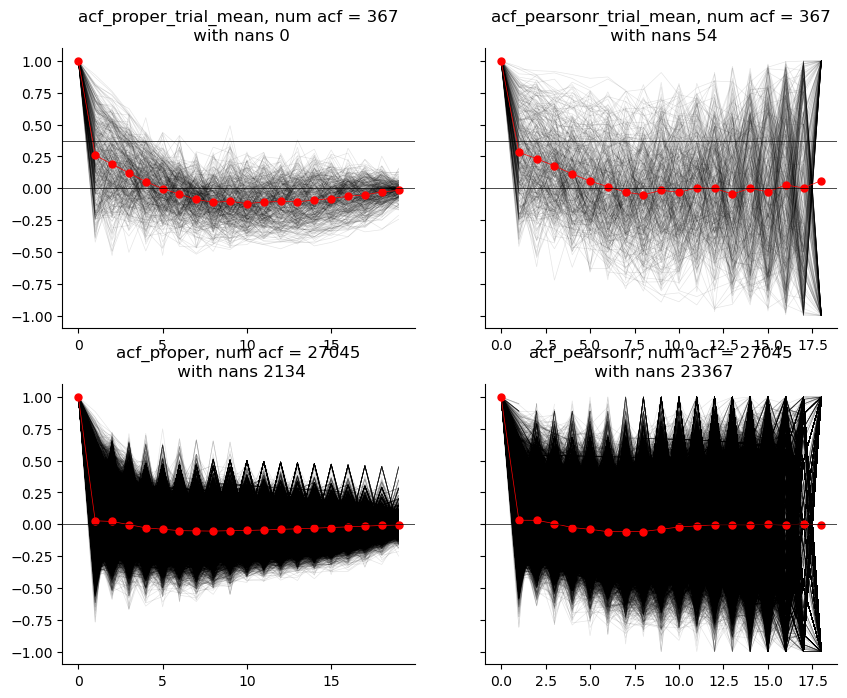

In [17]:
fig, axes = plt.subplots(2,2, figsize=(10,8), sharey=True)

for acf_ in range(len(acf_proper_trial_mean_df)):
    axes[0,0].plot(acf_proper_trial_mean_df[acf_cols].values[acf_, :], lw=0.5, c='k', alpha=0.1)
axes[0,0].plot(np.nanmean(acf_proper_trial_mean_df[acf_cols].values, axis=0), c='r', lw=0.5 ,marker='o', markersize='5')
axes[0,0].axhline(y=0, lw=0.5, color='k')
axes[0,0].axhline(y=1/np.e, lw=0.5, color='k')
axes[0,0].set_title('acf_proper_trial_mean, num acf = ' + str(len(acf_proper_trial_mean_df)) + '\n with nans ' + str(n_nans_acf_proper_trial_mean_df))

for acf_ in range(len(acf_pearsonr_trial_mean_df)):
    axes[0,1].plot(acf_pearsonr_trial_mean_df[acf_cols[:-1]].values[acf_, :], lw=0.5, c='k', alpha=0.1)
axes[0,1].plot(np.nanmean(acf_pearsonr_trial_mean_df[acf_cols[:-1]].values, axis=0), c='r', lw=0.5 ,marker='o', markersize='5')
axes[0,1].axhline(y=0, lw=0.5, color='k')
axes[0,1].axhline(y=1/np.e, lw=0.5, color='k')
axes[0,1].set_title('acf_pearsonr_trial_mean, num acf = ' + str(len(acf_pearsonr_trial_mean_df)) + '\n with nans ' + str(n_nans_acf_pearsonr_trial_mean_df))

for acf_ in range(len(acf_proper_df)):
    axes[1,0].plot(acf_proper_df[acf_cols].values[acf_, :], lw=0.5, c='k', alpha=0.1)
axes[1,0].plot(np.nanmean(acf_proper_df[acf_cols].values, axis=0), c='r', lw=0.5 ,marker='o', markersize='5')
axes[1,0].axhline(y=0, lw=0.5, color='k')
axes[1,0].set_title('acf_proper, num acf = ' + str(len(acf_proper_df)) + '\n with nans ' + str(n_nans_acf_proper_df))

for acf_ in range(len(acf_pearsonr_df)):
    axes[1,1].plot(acf_pearsonr_df[acf_cols[:-1]].values[acf_, :], lw=0.5, c='k', alpha=0.1)
axes[1,1].plot(np.nanmean(acf_pearsonr_df[acf_cols[:-1]].values, axis=0), c='r', lw=0.5 ,marker='o', markersize='5')
axes[1,1].axhline(y=0, lw=0.5, color='k')
axes[1,1].set_title('acf_pearsonr, num acf = ' + str(len(acf_pearsonr_df)) + '\n with nans ' + str(n_nans_acf_pearsonr_df))

sns.despine()

fig.savefig(save_folder + 'acf_proper_and_pearsonr_constraint_input_50ms_20lags.png' , bbox_inches='tight')

#### Calc acf as in Siegle (they use Pearson) - trial average

In [18]:
acf_average_trial_pearsonr_l = []
acf_matrix_l = []

unit_id_l = sua_pfdl_df['unit_id'].unique()
unit_id_calc_l = []

for unit in unit_id_l:
    print('Processing unit {}'.format(unit))
    sua_pfdl_one_trial_df = sua_pfdl_df.query('unit_id == @unit')
    print('N trials {}'.format(len(sua_pfdl_one_trial_df)))
    if len(sua_pfdl_one_trial_df) <= 1:
        print('ONLY 1 TRIAL: can not calculate, skipping...')
    else:
        acf_matrix, acf_average = acf_pearsonr_trial_avg(sua_pfdl_one_trial_df[bin_cols].values, n_lags)
        acf_average_trial_pearsonr_l.append(acf_average)
        acf_matrix_l.append(acf_matrix)
        unit_id_calc_l.append(unit)

acf_average_trial_pearsonr_df = pd.DataFrame(np.array(acf_average_trial_pearsonr_l), columns=acf_cols)
acf_average_trial_pearsonr_df.insert(0, 'unit_id', unit_id_calc_l)

print('NaNs in acf {}'.format(acf_average_trial_pearsonr_df.isnull().any().any()))
acf_average_trial_pearsonr_df.head(3)

Processing unit 0
N trials 92
nbins to use 20
Processing unit 3
N trials 91
nbins to use 20
Processing unit 4
N trials 108
nbins to use 20
Processing unit 5
N trials 109
nbins to use 20
Processing unit 6
N trials 125
nbins to use 20
Processing unit 7
N trials 51
nbins to use 20
Processing unit 8
N trials 78
nbins to use 20
Processing unit 9
N trials 58
nbins to use 20
Processing unit 10
N trials 81
nbins to use 20
Processing unit 11
N trials 80
nbins to use 20
Processing unit 12
N trials 43
nbins to use 20
Processing unit 14
N trials 71
nbins to use 20
Processing unit 15
N trials 37
nbins to use 20
Processing unit 16
N trials 97
nbins to use 20
Processing unit 17
N trials 108
nbins to use 20
Processing unit 18
N trials 84
nbins to use 20
Processing unit 20
N trials 63
nbins to use 20
Processing unit 21
N trials 80
nbins to use 20
Processing unit 22
N trials 62
nbins to use 20
Processing unit 26
N trials 50
nbins to use 20
Processing unit 27
N trials 36
nbins to use 20
Processing unit 2

,unit_id,acf_0,acf_1,acf_2,acf_3,acf_4,acf_5,acf_6,acf_7,acf_8,...,acf_10,acf_11,acf_12,acf_13,acf_14,acf_15,acf_16,acf_17,acf_18,acf_19
0,0,1.0,0.443787,0.429808,0.374760,0.333984,0.287734,0.240484,0.189922,0.194006,...,0.192847,0.148964,0.216269,0.151006,0.159405,0.112679,0.020760,0.038556,0.046108,-0.052432
1,3,1.0,0.436855,0.391458,0.371095,0.311763,0.294205,0.312247,0.282377,0.260343,...,0.266865,0.243661,0.274786,0.217886,0.234229,0.208189,0.152333,0.194667,0.227410,0.222422
2,4,1.0,0.124393,0.146276,0.066471,0.046590,0.025512,0.008332,0.029639,0.023872,...,0.000327,0.014934,-0.006864,0.030143,-0.017576,-0.023822,0.009294,-0.075483,0.031661,0.021984


In [19]:
acf_average_trial_pearsonr_df.to_pickle(save_folder + 'acf_average_trial_pearsonr_constrained_input_50ms_20lags_df.pkl')
np.save(save_folder + 'acf_matrix_l_constrained_input_50ms_20lags_df.npy', acf_matrix_l)

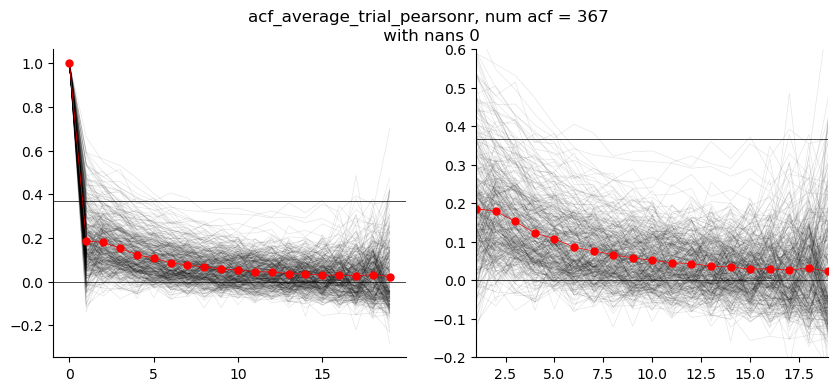

In [20]:
n_nans_acf_average_trial_pearsonr_df= acf_average_trial_pearsonr_df.isna().any(axis=1).sum()

fig, axes = plt.subplots(1,2, figsize=(10,4))

for acf_ in range(len(acf_average_trial_pearsonr_df)):
    axes[0].plot(acf_average_trial_pearsonr_df[acf_cols].values[acf_, :], lw=0.5, c='k', alpha=0.1)
axes[0].plot(np.nanmean(acf_average_trial_pearsonr_df[acf_cols].values, axis=0), c='r', lw=0.5 ,marker='o', markersize='5')
axes[0].axhline(y=0, lw=0.5, color='k')
axes[0].axhline(y=1/np.e, lw=0.5, color='k')

for acf_ in range(len(acf_average_trial_pearsonr_df)):
    axes[1].plot(acf_average_trial_pearsonr_df[acf_cols].values[acf_, :], lw=0.5, c='k', alpha=0.1)
axes[1].plot(np.nanmean(acf_average_trial_pearsonr_df[acf_cols].values, axis=0), c='r', lw=0.5 ,marker='o', markersize='5')
axes[1].axhline(y=0, lw=0.5, color='k')
axes[1].axhline(y=1/np.e, lw=0.5, color='k')
axes[1].set_xlim([1,19])
axes[1].set_ylim([-0.2,0.6])

fig.suptitle('acf_average_trial_pearsonr, num acf = ' + str(len(acf_average_trial_pearsonr_df)) + '\n with nans ' 
             + str(n_nans_acf_average_trial_pearsonr_df))

sns.despine()
fig.savefig(save_folder + 'acf_average_trial_pearsonr_constrained_input_50ms_20lags.png' , bbox_inches='tight')

C:\Users\ipochino\AppData\Local\Temp\ipykernel_11996\541719264.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1,1,figsize=(6,6))


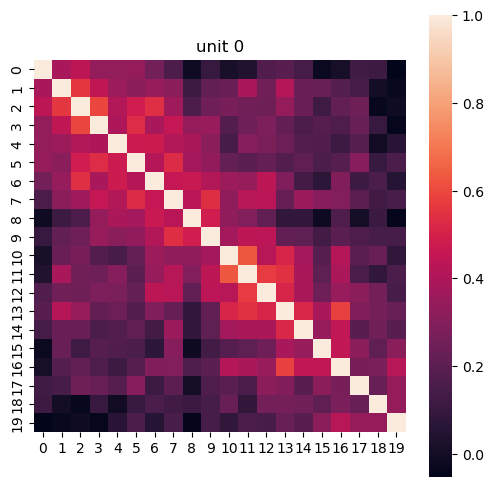

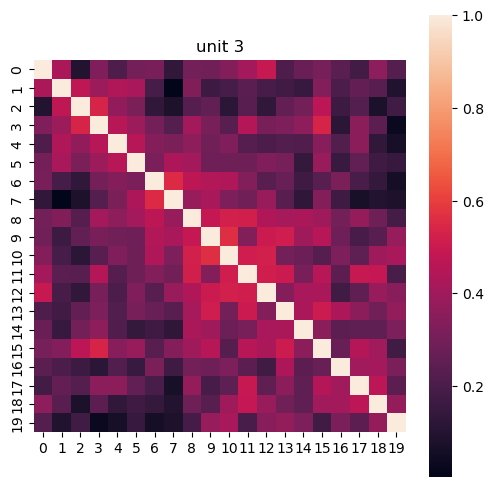

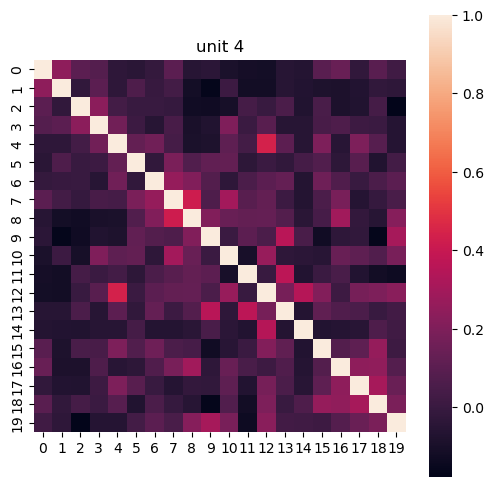

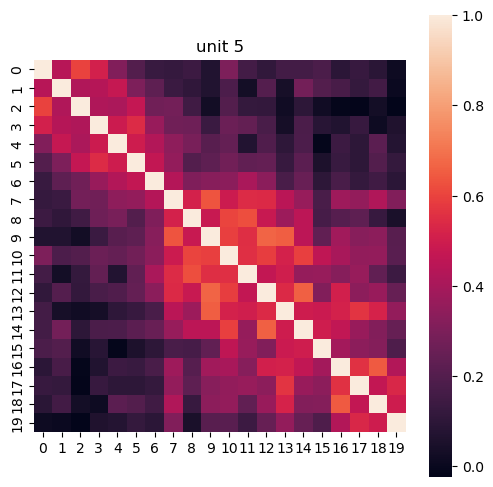

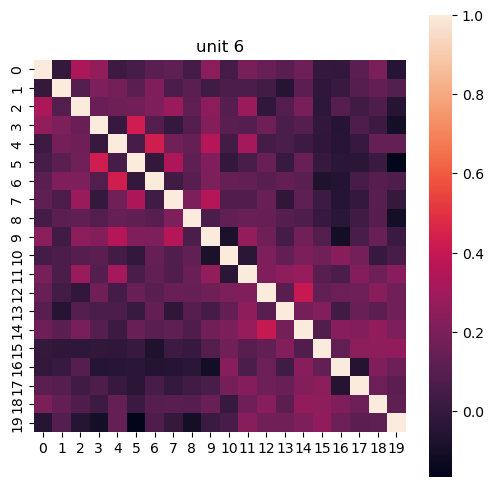

...

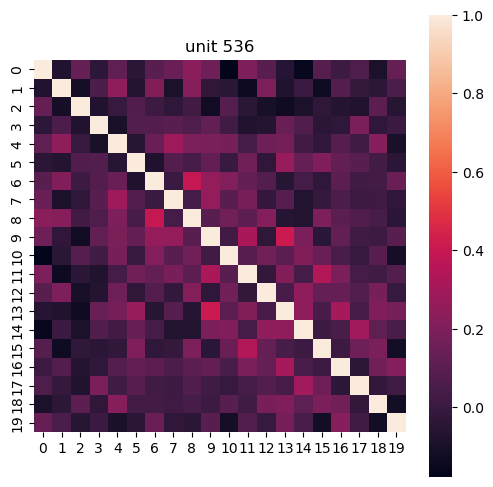

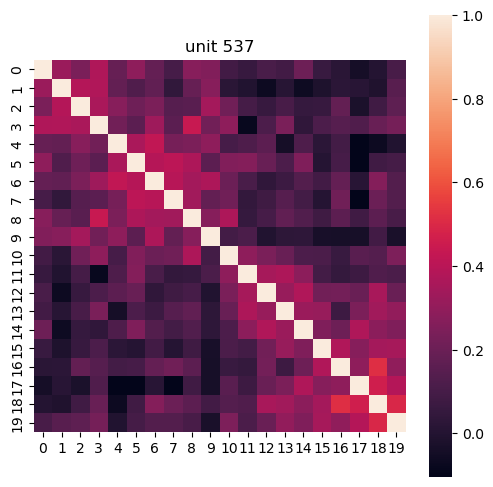

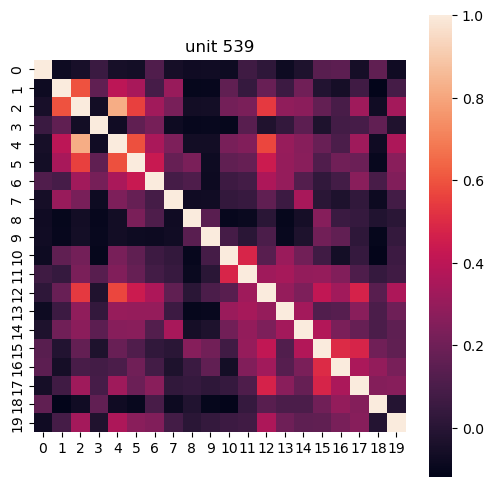

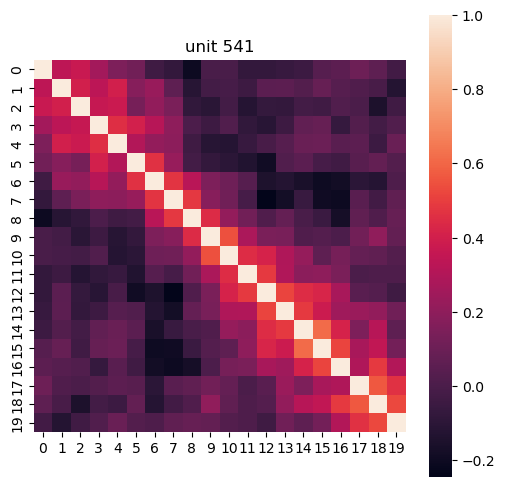

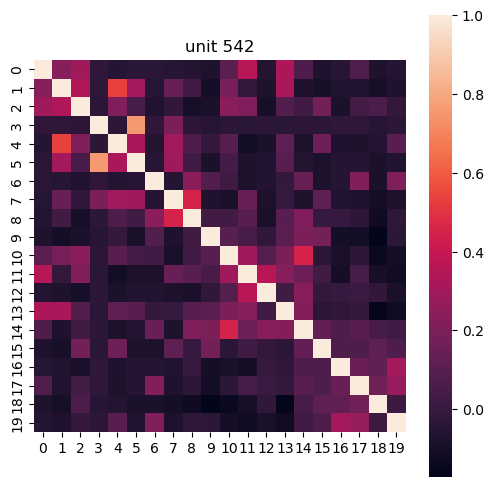

In [21]:
for idx_, acf_matrix_ in enumerate(acf_matrix_l):
    fig, axes = plt.subplots(1,1,figsize=(6,6))
    acf_matrix_plot = acf_matrix_.T + acf_matrix_
    np.fill_diagonal(acf_matrix_plot, 1)
    sns.heatmap(acf_matrix_plot, ax=axes)
    axes.set_aspect('equal', adjustable='box')
    axes.set_title('unit ' + str(int(acf_average_trial_pearsonr_df.iloc[idx_]['unit_id'])))
    fig.savefig(save_folder + 'acf_matrices_constraint_input\\unit_' + str(int(acf_average_trial_pearsonr_df.iloc[idx_]['unit_id'])), bbox_inches='tight')